# Robust Local Feature Matching for Homography Estimation under Photometric and Blur Corruptions

This notebook implements the experimental part of the ECE 531 computer vision term project.

The main goal is to evaluate the robustness of local feature matching methods under photometric and blur corruptions. In the first stage, a classical SIFT + RANSAC homography estimation pipeline is implemented as the baseline method.

Later stages will include:
- synthetic low-light corruption,
- motion blur,
- defocus blur,
- CLAHE preprocessing,
- multi-scale matching,
- joint confidence scoring using inlier count and reprojection error.

## 1. Environment setup and reproducibility

This first code cell imports the required libraries and fixes the random seed.  
The aim is to make the experiment as repeatable as possible when the notebook is run again in the same Kaggle environment.

In [1]:
# Core imports and seed settings
import os
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Reproducibility settings
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
cv2.setRNGSeed(SEED)

# OpenCV optimization can sometimes create small numerical differences.
# We disable it to make the results more reproducible.
cv2.setUseOptimized(False)

print("OpenCV version:", cv2.__version__)
print("Random seed:", SEED)

OpenCV version: 4.13.0
Random seed: 42


## 2. Dataset path

The experiments use the HPatches sequence dataset mounted from the Kaggle input directory.  
This path is specific to the current Kaggle notebook. If the notebook is moved to another environment, only this dataset path may need to be updated.

In [2]:
# Kaggle dataset location.

DATASET_ROOT = "/kaggle/input/datasets/javidtheimmortal/hpatches-sequence-release/hpatches-sequences-release"

print("Dataset root:")
print(DATASET_ROOT)

print("\nFirst 10 sequences:")
print(sorted(os.listdir(DATASET_ROOT))[:10])

Dataset root:
/kaggle/input/datasets/javidtheimmortal/hpatches-sequence-release/hpatches-sequences-release

First 10 sequences:
['i_ajuntament', 'i_autannes', 'i_bologna', 'i_books', 'i_boutique', 'i_bridger', 'i_brooklyn', 'i_castle', 'i_chestnuts', 'i_contruction']


## 3. Sanity-check pair

The first sequence is used as a simple sanity check.  
This helps confirm that image loading, homography loading and the SIFT + RANSAC pipeline work before moving to a more challenging example.

In [3]:
# Load the first image pair and its ground-truth homography.
# This pair is used only as an initial check before the main experiment.

sequence_name = "i_ajuntament"
sequence_path = os.path.join(DATASET_ROOT, sequence_name)

img1_path = os.path.join(sequence_path, "1.ppm")
img2_path = os.path.join(sequence_path, "2.ppm")
H_gt_path = os.path.join(sequence_path, "H_1_2")

img1 = cv2.imread(img1_path)
img2 = cv2.imread(img2_path)
H_gt = np.loadtxt(H_gt_path)

print("Selected sequence:", sequence_name)
print("Image 1 path:", img1_path)
print("Image 2 path:", img2_path)
print("Image 1 shape:", img1.shape)
print("Image 2 shape:", img2.shape)

print("\nGround-truth homography H_1_2:")
print(H_gt)

Selected sequence: i_ajuntament
Image 1 path: /kaggle/input/datasets/javidtheimmortal/hpatches-sequence-release/hpatches-sequences-release/i_ajuntament/1.ppm
Image 2 path: /kaggle/input/datasets/javidtheimmortal/hpatches-sequence-release/hpatches-sequences-release/i_ajuntament/2.ppm
Image 1 shape: (480, 640, 3)
Image 2 shape: (480, 640, 3)

Ground-truth homography H_1_2:
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


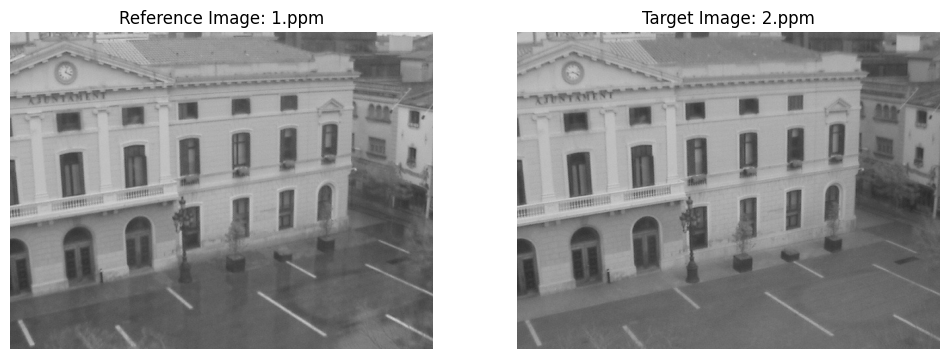

In [4]:
# Display the sanity-check image pair.
# OpenCV loads images as BGR, so they are converted to RGB for Matplotlib.

img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title("Reference Image: 1.ppm")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title("Target Image: 2.ppm")
plt.axis("off")

plt.show()

## 4. Baseline method: SIFT + Lowe ratio test + RANSAC

This function is the classical baseline of the project.  
It detects SIFT keypoints, matches descriptors using a nearest-neighbor matcher, filters weak matches with Lowe's ratio test, then estimates the homography with RANSAC.

In [5]:
# Baseline pipeline function.
# The function returns both all good matches and the RANSAC inlier matches so later metrics can be computed.

def sift_match_and_estimate_homography(img1, img2, ratio_thresh=0.75, ransac_thresh=3.0):
    """
    SIFT + Lowe ratio test + RANSAC homography estimation.

    Parameters
    ----------
    img1 : np.ndarray
        Reference image in BGR format.
    img2 : np.ndarray
        Target image in BGR format.
    ratio_thresh : float
        Lowe's ratio test threshold.
    ransac_thresh : float
        RANSAC reprojection threshold in pixels.

    Returns
    -------
    kp1, kp2 : list
        Keypoints from image 1 and image 2.
    good_matches : list
        Matches after Lowe's ratio test.
    inlier_matches : list
        Matches accepted as inliers by RANSAC.
    mask : np.ndarray
        RANSAC inlier mask.
    H_est : np.ndarray
        Estimated homography matrix.
    """

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    sift = cv2.SIFT_create()

    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    if des1 is None or des2 is None:
        return kp1, kp2, [], [], None, None

    bf = cv2.BFMatcher(cv2.NORM_L2)

    raw_matches = bf.knnMatch(des1, des2, k=2)

    good_matches = []
    for pair in raw_matches:
        if len(pair) < 2:
            continue

        m, n = pair

        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    if len(good_matches) < 4:
        return kp1, kp2, good_matches, [], None, None

    src_pts = np.float32(
        [kp1[m.queryIdx].pt for m in good_matches]
    ).reshape(-1, 1, 2)

    dst_pts = np.float32(
        [kp2[m.trainIdx].pt for m in good_matches]
    ).reshape(-1, 1, 2)

    H_est, mask = cv2.findHomography(
        src_pts,
        dst_pts,
        cv2.RANSAC,
        ransac_thresh
    )

    if mask is None:
        inlier_matches = []
    else:
        inlier_matches = [
            good_matches[i]
            for i in range(len(good_matches))
            if mask[i][0] == 1
        ]

    return kp1, kp2, good_matches, inlier_matches, mask, H_est

In [6]:
# Run the baseline once on the sanity-check pair.
# This confirms that SIFT detection, matching and homography estimation work.

kp1, kp2, good_matches, inlier_matches, mask, H_est = sift_match_and_estimate_homography(
    img1,
    img2,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

print("SIFT + RANSAC Baseline Results")
print("--------------------------------")
print("Number of keypoints in image 1:", len(kp1))
print("Number of keypoints in image 2:", len(kp2))
print("Number of good matches after Lowe ratio test:", len(good_matches))
print("Number of RANSAC inliers:", len(inlier_matches))

print("\nEstimated homography matrix:")
print(H_est)

SIFT + RANSAC Baseline Results
--------------------------------
Number of keypoints in image 1: 840
Number of keypoints in image 2: 780
Number of good matches after Lowe ratio test: 348
Number of RANSAC inliers: 284

Estimated homography matrix:
[[ 9.99035913e-01  5.21623148e-04  2.87229997e-01]
 [-4.43352345e-05  9.99958955e-01 -1.80112223e-01]
 [-1.41395541e-06 -7.63425688e-07  1.00000000e+00]]


## 5. Evaluation metrics

The project uses two main geometric metrics here:

- **Mean reprojection error:** lower is better.
- **Joint confidence score:** combines the number of RANSAC inliers and the reprojection error, so higher is better.

In [7]:
# Metric helper functions.
# These are reused throughout the notebook for every corruption and method.

def compute_reprojection_error(kp1, kp2, matches, H):
    """
    Computes the mean reprojection error for a given homography.

    The points from image 1 are projected onto image 2 using H.
    Then, the Euclidean distance between projected points and matched points
    in image 2 is calculated.
    """

    if H is None or len(matches) == 0:
        return np.inf

    src_pts = np.float32(
        [kp1[m.queryIdx].pt for m in matches]
    ).reshape(-1, 1, 2)

    dst_pts = np.float32(
        [kp2[m.trainIdx].pt for m in matches]
    ).reshape(-1, 1, 2)

    projected_pts = cv2.perspectiveTransform(src_pts, H)

    errors = np.linalg.norm(projected_pts - dst_pts, axis=2)

    return float(np.mean(errors))


def joint_confidence_score(num_inliers, reprojection_error):
    """
    Joint score combining RANSAC inlier count and mean reprojection error.

    A higher inlier count increases the score.
    A higher reprojection error decreases the score.
    """

    if reprojection_error == np.inf:
        return 0.0

    return num_inliers / (1.0 + reprojection_error)

In [8]:
# Compute the extra metrics for the sanity-check baseline result.

reproj_error = compute_reprojection_error(
    kp1,
    kp2,
    inlier_matches,
    H_est
)

joint_score = joint_confidence_score(
    num_inliers=len(inlier_matches),
    reprojection_error=reproj_error
)

print("Additional Evaluation Metrics")
print("-----------------------------")
print("Mean reprojection error:", reproj_error)
print("Joint confidence score:", joint_score)

Additional Evaluation Metrics
-----------------------------
Mean reprojection error: 0.6718658804893494
Joint confidence score: 169.8700854621629


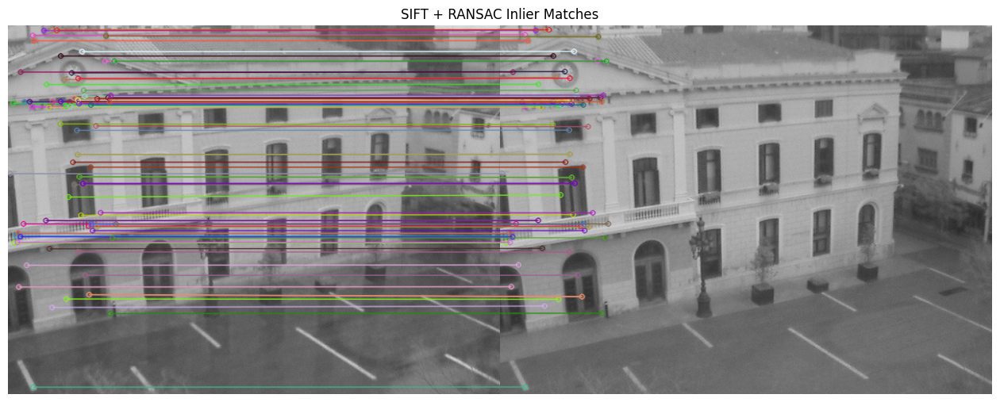

In [9]:
# Quick visual check of the inlier matches.

matched_vis = cv2.drawMatches(
    img1_rgb,
    kp1,
    img2_rgb,
    kp2,
    inlier_matches[:80],
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(16, 8))
plt.imshow(matched_vis)
plt.title("SIFT + RANSAC Inlier Matches")
plt.axis("off")
plt.show()

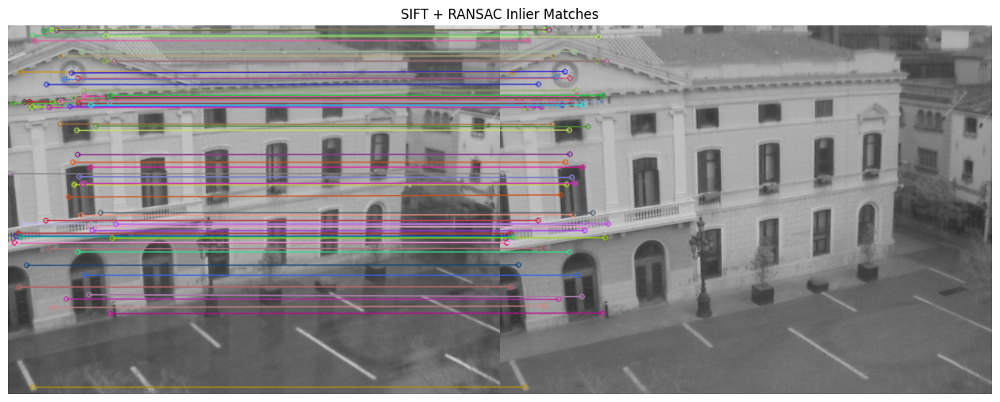

Saved figure to: /kaggle/working/project_outputs/sift_ransac_inlier_matches.png


In [10]:
# Save the same inlier-match visualization for the report files.

output_dir = "/kaggle/working/project_outputs"
os.makedirs(output_dir, exist_ok=True)

matched_vis = cv2.drawMatches(
    img1_rgb,
    kp1,
    img2_rgb,
    kp2,
    inlier_matches[:80],
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(16, 8))
plt.imshow(matched_vis)
plt.title("SIFT + RANSAC Inlier Matches")
plt.axis("off")

save_path = os.path.join(output_dir, "sift_ransac_inlier_matches.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

In [11]:
# Convert the sanity-check result into a table.
# This makes the result easier to save and compare later.

baseline_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "keypoints_img1": len(kp1),
    "keypoints_img2": len(kp2),
    "good_matches": len(good_matches),
    "ransac_inliers": len(inlier_matches),
    "mean_reprojection_error_px": reproj_error,
    "joint_confidence_score": joint_score
}

baseline_df = pd.DataFrame([baseline_result])

baseline_df

,sequence,image_pair,method,ratio_threshold,ransac_threshold_px,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,i_ajuntament,1-2,SIFT + RANSAC,0.75,3.0,840,780,348,284,0.671866,169.870085


In [12]:
csv_path = os.path.join(output_dir, "baseline_sift_ransac_result.csv")

baseline_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/baseline_sift_ransac_result.csv


## 6. Main experimental sequence

After the sanity check, the notebook switches to the `v_weapons` sequence.  
The remaining experiments are performed on this pair because it is more challenging and gives clearer corruption effects.

In [13]:
# Load the main HPatches sequence used in the remaining experiments.

sequence_name = "v_weapons"
sequence_path = os.path.join(DATASET_ROOT, sequence_name)

img1_path = os.path.join(sequence_path, "1.ppm")
img2_path = os.path.join(sequence_path, "2.ppm")
H_gt_path = os.path.join(sequence_path, "H_1_2")

img1 = cv2.imread(img1_path)
img2 = cv2.imread(img2_path)
H_gt = np.loadtxt(H_gt_path)

img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

print("Selected sequence:", sequence_name)
print("Image 1 shape:", img1.shape)
print("Image 2 shape:", img2.shape)

print("\nGround-truth homography H_1_2:")
print(H_gt)

Selected sequence: v_weapons
Image 1 shape: (1290, 968, 3)
Image 2 shape: (1290, 968, 3)

Ground-truth homography H_1_2:
[[ 1.3413e+00  6.1760e-03  1.5328e+02]
 [ 3.0309e-01  1.1645e+00 -1.0538e+02]
 [ 3.9231e-04 -4.6409e-05  9.9937e-01]]


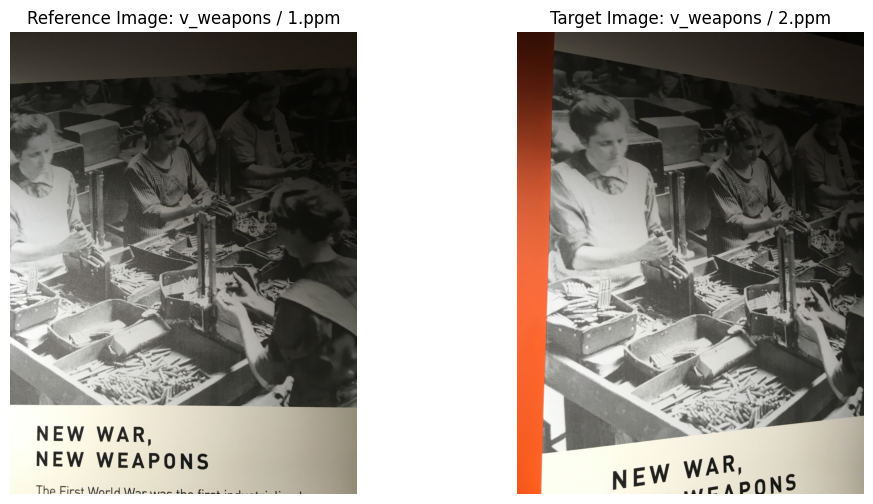

In [14]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title("Reference Image: v_weapons / 1.ppm")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title("Target Image: v_weapons / 2.ppm")
plt.axis("off")

plt.show()

In [15]:
# Clean-image baseline on the main sequence.
# This result is later used as the reference for robustness drop.

kp1, kp2, good_matches, inlier_matches, mask, H_est = sift_match_and_estimate_homography(
    img1,
    img2,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error = compute_reprojection_error(
    kp1,
    kp2,
    inlier_matches,
    H_est
)

joint_score = joint_confidence_score(
    num_inliers=len(inlier_matches),
    reprojection_error=reproj_error
)

print("SIFT + RANSAC Baseline Results for v_weapons")
print("--------------------------------------------")
print("Number of keypoints in image 1:", len(kp1))
print("Number of keypoints in image 2:", len(kp2))
print("Number of good matches after Lowe ratio test:", len(good_matches))
print("Number of RANSAC inliers:", len(inlier_matches))
print("Mean reprojection error:", reproj_error)
print("Joint confidence score:", joint_score)

print("\nEstimated homography matrix:")
print(H_est)

print("\nGround-truth homography matrix:")
print(H_gt)

SIFT + RANSAC Baseline Results for v_weapons
--------------------------------------------
Number of keypoints in image 1: 4355
Number of keypoints in image 2: 4118
Number of good matches after Lowe ratio test: 2072
Number of RANSAC inliers: 1958
Mean reprojection error: 0.6334116458892822
Joint confidence score: 1198.718035914334

Estimated homography matrix:
[[ 1.33958568e+00  5.03999652e-03  1.54002168e+02]
 [ 3.02491294e-01  1.16226545e+00 -1.04370409e+02]
 [ 3.91204084e-04 -4.81573398e-05  1.00000000e+00]]

Ground-truth homography matrix:
[[ 1.3413e+00  6.1760e-03  1.5328e+02]
 [ 3.0309e-01  1.1645e+00 -1.0538e+02]
 [ 3.9231e-04 -4.6409e-05  9.9937e-01]]


In [16]:
v_weapons_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "keypoints_img1": len(kp1),
    "keypoints_img2": len(kp2),
    "good_matches": len(good_matches),
    "ransac_inliers": len(inlier_matches),
    "mean_reprojection_error_px": reproj_error,
    "joint_confidence_score": joint_score
}

v_weapons_df = pd.DataFrame([v_weapons_result])

v_weapons_df

,sequence,image_pair,method,ratio_threshold,ransac_threshold_px,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,SIFT + RANSAC,0.75,3.0,4355,4118,2072,1958,0.633412,1198.718036


In [17]:
csv_path = os.path.join(output_dir, "v_weapons_sift_ransac_result.csv")

v_weapons_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/v_weapons_sift_ransac_result.csv


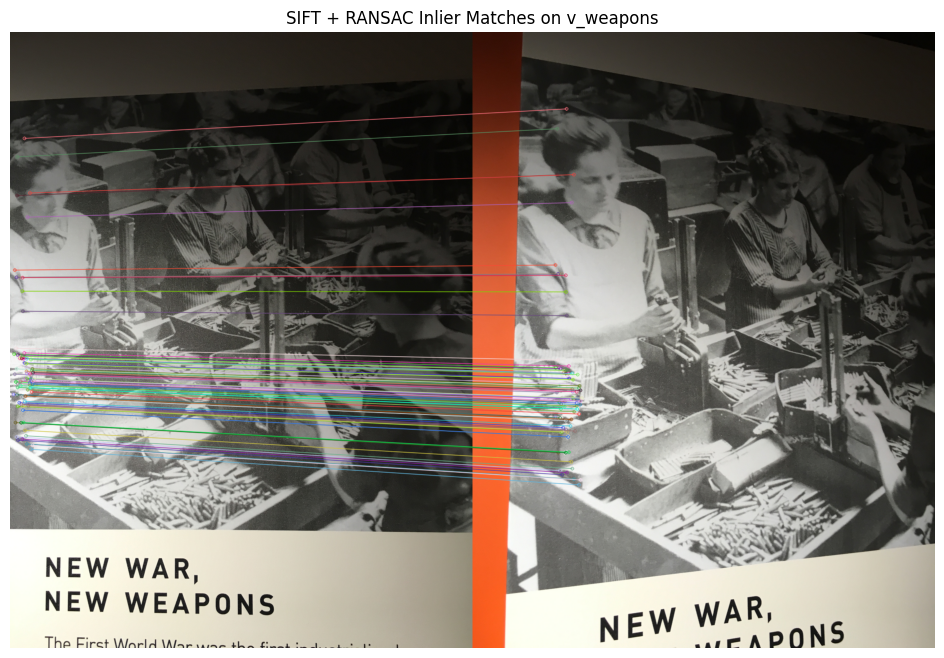

Saved figure to: /kaggle/working/project_outputs/v_weapons_sift_ransac_inlier_matches.png


In [18]:
matched_vis = cv2.drawMatches(
    img1_rgb,
    kp1,
    img2_rgb,
    kp2,
    inlier_matches[:80],
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(16, 8))
plt.imshow(matched_vis)
plt.title("SIFT + RANSAC Inlier Matches on v_weapons")
plt.axis("off")

save_path = os.path.join(output_dir, "v_weapons_sift_ransac_inlier_matches.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

## 7. Synthetic corruptions

This section creates controlled image corruptions.  
The goal is to test whether local feature matching remains reliable when the target image is degraded.

The corruptions are separated into:
- low-light,
- motion blur,
- defocus blur.

Motion blur and defocus blur are intentionally treated separately because they affect local image structures in different ways.

In [19]:
# Low-light corruption function.
# Gamma darkening and brightness reduction are used to simulate poor illumination.

def apply_low_light(image, gamma=2.0, brightness_factor=0.6):
    """
    Applies synthetic low-light corruption to an image.

    gamma > 1 darkens the image.
    brightness_factor < 1 reduces the overall brightness.
    """

    image_float = image.astype(np.float32) / 255.0

    darkened = np.power(image_float, gamma)
    darkened = darkened * brightness_factor

    darkened = np.clip(darkened * 255.0, 0, 255).astype(np.uint8)

    return darkened

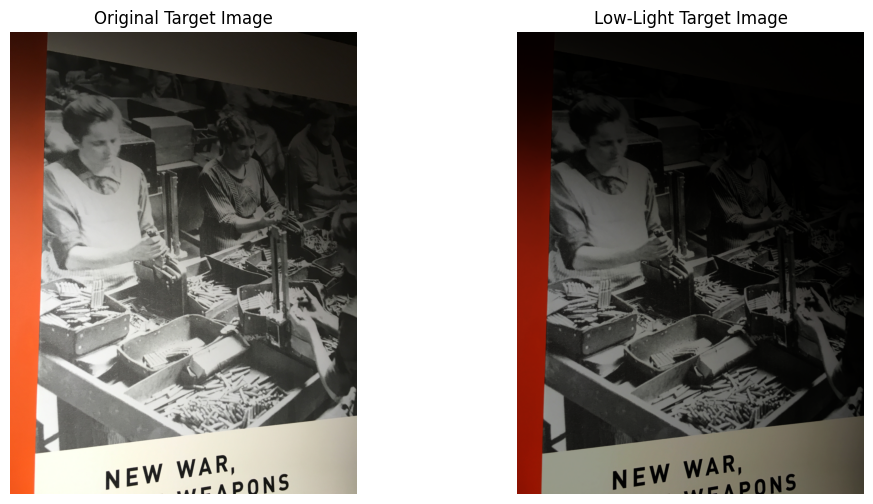

In [20]:
# Create and display the low-light target image.


img2_low_light = apply_low_light(
    img2,
    gamma=2.0,
    brightness_factor=0.6
)

img2_low_light_rgb = cv2.cvtColor(img2_low_light, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img2_rgb)
plt.title("Original Target Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img2_low_light_rgb)
plt.title("Low-Light Target Image")
plt.axis("off")

plt.show()

In [21]:
# Evaluate the baseline under low-light corruption.

kp1_ll, kp2_ll, good_matches_ll, inlier_matches_ll, mask_ll, H_est_ll = sift_match_and_estimate_homography(
    img1,
    img2_low_light,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_ll = compute_reprojection_error(
    kp1_ll,
    kp2_ll,
    inlier_matches_ll,
    H_est_ll
)

joint_score_ll = joint_confidence_score(
    num_inliers=len(inlier_matches_ll),
    reprojection_error=reproj_error_ll
)

print("SIFT + RANSAC Results under Low-Light Corruption")
print("------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_ll))
print("Number of keypoints in low-light image 2:", len(kp2_ll))
print("Number of good matches after Lowe ratio test:", len(good_matches_ll))
print("Number of RANSAC inliers:", len(inlier_matches_ll))
print("Mean reprojection error:", reproj_error_ll)
print("Joint confidence score:", joint_score_ll)

print("\nEstimated homography matrix:")
print(H_est_ll)

SIFT + RANSAC Results under Low-Light Corruption
------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in low-light image 2: 2308
Number of good matches after Lowe ratio test: 1326
Number of RANSAC inliers: 1182
Mean reprojection error: 0.6339492797851562
Joint confidence score: 723.4006677094764

Estimated homography matrix:
[[ 1.33767890e+00  8.09061794e-03  1.52421972e+02]
 [ 2.98523633e-01  1.16565829e+00 -1.05132120e+02]
 [ 3.87157887e-04 -4.54497303e-05  1.00000000e+00]]


In [22]:
low_light_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "low_light",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "gamma": 2.0,
    "brightness_factor": 0.6,
    "keypoints_img1": len(kp1_ll),
    "keypoints_img2": len(kp2_ll),
    "good_matches": len(good_matches_ll),
    "ransac_inliers": len(inlier_matches_ll),
    "mean_reprojection_error_px": reproj_error_ll,
    "joint_confidence_score": joint_score_ll
}

low_light_df = pd.DataFrame([low_light_result])

low_light_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,gamma,brightness_factor,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,low_light,SIFT + RANSAC,0.75,3.0,2.0,0.6,4357,2308,1326,1182,0.633949,723.400668


In [23]:
# Create the clean and low-light comparison table.
# This is the first robustness comparison.

clean_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "clean",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "gamma": None,
    "brightness_factor": None,
    "keypoints_img1": len(kp1),
    "keypoints_img2": len(kp2),
    "good_matches": len(good_matches),
    "ransac_inliers": len(inlier_matches),
    "mean_reprojection_error_px": reproj_error,
    "joint_confidence_score": joint_score
}

clean_df = pd.DataFrame([clean_result])

clean_vs_lowlight_df = pd.concat(
    [clean_df, low_light_df],
    ignore_index=True
)

clean_vs_lowlight_df

/tmp/ipykernel_58/278217473.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  clean_vs_lowlight_df = pd.concat(


,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,gamma,brightness_factor,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,clean,SIFT + RANSAC,0.75,3.0,NaN,NaN,4355,4118,2072,1958,0.633412,1198.718036
1,v_weapons,1-2,low_light,SIFT + RANSAC,0.75,3.0,2.0,0.6,4357,2308,1326,1182,0.633949,723.400668


In [24]:
csv_path = os.path.join(output_dir, "clean_vs_lowlight_sift_ransac.csv")

clean_vs_lowlight_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/clean_vs_lowlight_sift_ransac.csv


In [25]:
# Motion blur function.
# A directional blur kernel is used to imitate camera or object motion.

def apply_motion_blur(image, kernel_size=15, angle=0):
    """
    Applies synthetic motion blur to an image.

    Parameters
    ----------
    image : np.ndarray
        Input image in BGR format.
    kernel_size : int
        Length of the motion blur kernel.
    angle : float
        Blur angle in degrees. 0 means horizontal blur.
    """

    kernel = np.zeros((kernel_size, kernel_size), dtype=np.float32)

    center = kernel_size // 2
    kernel[center, :] = 1.0

    rotation_matrix = cv2.getRotationMatrix2D(
        (center, center),
        angle,
        1.0
    )

    kernel = cv2.warpAffine(
        kernel,
        rotation_matrix,
        (kernel_size, kernel_size)
    )

    kernel = kernel / np.sum(kernel)

    blurred = cv2.filter2D(image, -1, kernel)

    return blurred

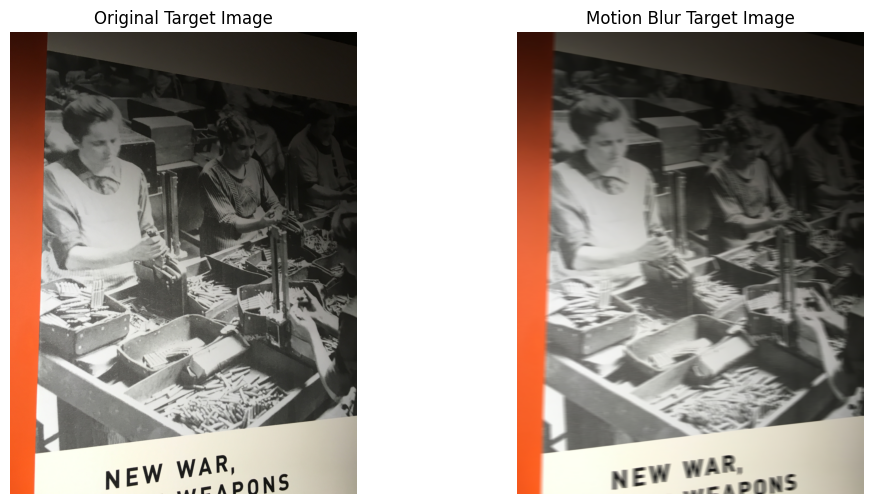

In [26]:
img2_motion_blur = apply_motion_blur(
    img2,
    kernel_size=15,
    angle=0
)

img2_motion_blur_rgb = cv2.cvtColor(img2_motion_blur, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img2_rgb)
plt.title("Original Target Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img2_motion_blur_rgb)
plt.title("Motion Blur Target Image")
plt.axis("off")

plt.show()

In [27]:
# Evaluate the baseline under motion blur.

kp1_mb, kp2_mb, good_matches_mb, inlier_matches_mb, mask_mb, H_est_mb = sift_match_and_estimate_homography(
    img1,
    img2_motion_blur,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_mb = compute_reprojection_error(
    kp1_mb,
    kp2_mb,
    inlier_matches_mb,
    H_est_mb
)

joint_score_mb = joint_confidence_score(
    num_inliers=len(inlier_matches_mb),
    reprojection_error=reproj_error_mb
)

print("SIFT + RANSAC Results under Motion Blur Corruption")
print("--------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_mb))
print("Number of keypoints in motion-blur image 2:", len(kp2_mb))
print("Number of good matches after Lowe ratio test:", len(good_matches_mb))
print("Number of RANSAC inliers:", len(inlier_matches_mb))
print("Mean reprojection error:", reproj_error_mb)
print("Joint confidence score:", joint_score_mb)

print("\nEstimated homography matrix:")
print(H_est_mb)

SIFT + RANSAC Results under Motion Blur Corruption
--------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in motion-blur image 2: 854
Number of good matches after Lowe ratio test: 353
Number of RANSAC inliers: 192
Mean reprojection error: 1.487930178642273
Joint confidence score: 77.17258371968433

Estimated homography matrix:
[[ 1.33718722e+00  4.53458892e-03  1.53802581e+02]
 [ 3.08569743e-01  1.15418780e+00 -1.02551821e+02]
 [ 3.98084989e-04 -5.45011392e-05  1.00000000e+00]]


In [28]:
motion_blur_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "motion_blur",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "motion_kernel_size": 15,
    "motion_angle_deg": 0,
    "keypoints_img1": len(kp1_mb),
    "keypoints_img2": len(kp2_mb),
    "good_matches": len(good_matches_mb),
    "ransac_inliers": len(inlier_matches_mb),
    "mean_reprojection_error_px": reproj_error_mb,
    "joint_confidence_score": joint_score_mb
}

motion_blur_df = pd.DataFrame([motion_blur_result])

motion_blur_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,motion_kernel_size,motion_angle_deg,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,motion_blur,SIFT + RANSAC,0.75,3.0,15,0,4357,854,353,192,1.48793,77.172584


In [29]:
corruption_results_df = pd.concat(
    [
        clean_df,
        low_light_df,
        motion_blur_df
    ],
    ignore_index=True,
    sort=False
)

corruption_results_df

/tmp/ipykernel_58/3657490332.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  corruption_results_df = pd.concat(


,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,gamma,brightness_factor,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score,motion_kernel_size,motion_angle_deg
0,v_weapons,1-2,clean,SIFT + RANSAC,0.75,3.0,NaN,NaN,4355,4118,2072,1958,0.633412,1198.718036,NaN,NaN
1,v_weapons,1-2,low_light,SIFT + RANSAC,0.75,3.0,2.0,0.6,4357,2308,1326,1182,0.633949,723.400668,NaN,NaN
2,v_weapons,1-2,motion_blur,SIFT + RANSAC,0.75,3.0,NaN,NaN,4357,854,353,192,1.487930,77.172584,15.0,0.0


In [30]:
csv_path = os.path.join(output_dir, "corruption_results_sift_ransac_clean_lowlight_motion.csv")

corruption_results_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/corruption_results_sift_ransac_clean_lowlight_motion.csv


In [31]:
# Defocus blur function.
# Gaussian blur is used here as a simple approximation of out-of-focus blur.

def apply_defocus_blur(image, kernel_size=15, sigma=3.0):
    """
    Applies synthetic defocus blur to an image.

    Defocus blur is approximated using Gaussian blur.
    
    Parameters
    ----------
    image : np.ndarray
        Input image in BGR format.
    kernel_size : int
        Size of the Gaussian kernel. It must be an odd number.
    sigma : float
        Standard deviation of the Gaussian kernel.
    """

    if kernel_size % 2 == 0:
        kernel_size += 1

    blurred = cv2.GaussianBlur(
        image,
        (kernel_size, kernel_size),
        sigmaX=sigma,
        sigmaY=sigma
    )

    return blurred

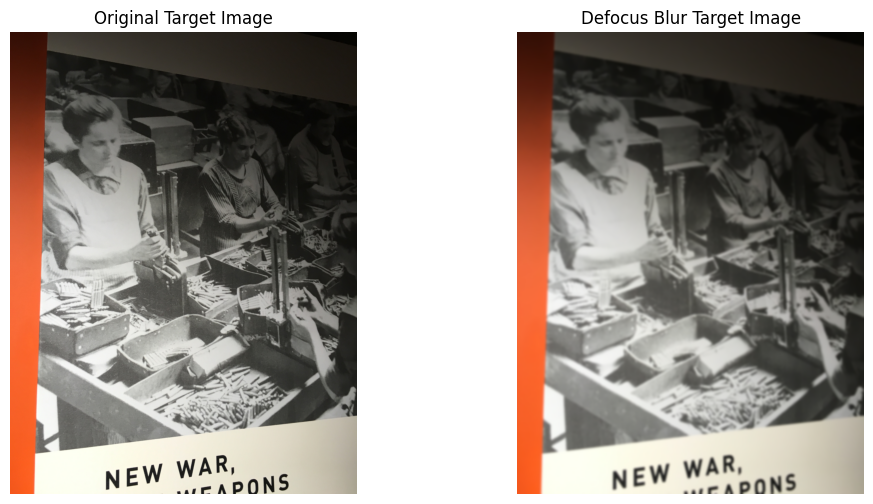

In [32]:
img2_defocus_blur = apply_defocus_blur(
    img2,
    kernel_size=15,
    sigma=3.0
)

img2_defocus_blur_rgb = cv2.cvtColor(img2_defocus_blur, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img2_rgb)
plt.title("Original Target Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img2_defocus_blur_rgb)
plt.title("Defocus Blur Target Image")
plt.axis("off")

plt.show()

In [33]:
# Evaluate the baseline under defocus blur.

kp1_db, kp2_db, good_matches_db, inlier_matches_db, mask_db, H_est_db = sift_match_and_estimate_homography(
    img1,
    img2_defocus_blur,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_db = compute_reprojection_error(
    kp1_db,
    kp2_db,
    inlier_matches_db,
    H_est_db
)

joint_score_db = joint_confidence_score(
    num_inliers=len(inlier_matches_db),
    reprojection_error=reproj_error_db
)

print("SIFT + RANSAC Results under Defocus Blur Corruption")
print("---------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_db))
print("Number of keypoints in defocus-blur image 2:", len(kp2_db))
print("Number of good matches after Lowe ratio test:", len(good_matches_db))
print("Number of RANSAC inliers:", len(inlier_matches_db))
print("Mean reprojection error:", reproj_error_db)
print("Joint confidence score:", joint_score_db)

print("\nEstimated homography matrix:")
print(H_est_db)

SIFT + RANSAC Results under Defocus Blur Corruption
---------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in defocus-blur image 2: 859
Number of good matches after Lowe ratio test: 430
Number of RANSAC inliers: 316
Mean reprojection error: 1.16094172000885
Joint confidence score: 146.23254161556278

Estimated homography matrix:
[[ 1.34224630e+00  6.38979173e-03  1.53061909e+02]
 [ 3.03124714e-01  1.16458161e+00 -1.05174788e+02]
 [ 3.92208647e-04 -4.67485601e-05  1.00000000e+00]]


In [34]:
defocus_blur_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "defocus_blur",
    "method": "SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "defocus_kernel_size": 15,
    "defocus_sigma": 3.0,
    "keypoints_img1": len(kp1_db),
    "keypoints_img2": len(kp2_db),
    "good_matches": len(good_matches_db),
    "ransac_inliers": len(inlier_matches_db),
    "mean_reprojection_error_px": reproj_error_db,
    "joint_confidence_score": joint_score_db
}

defocus_blur_df = pd.DataFrame([defocus_blur_result])

defocus_blur_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,defocus_kernel_size,defocus_sigma,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,defocus_blur,SIFT + RANSAC,0.75,3.0,15,3.0,4357,859,430,316,1.160942,146.232542


## 7.1 Frequency signature analysis: motion blur vs. defocus blur

Motion blur and defocus blur affect the image in fundamentally different ways in the frequency domain.

Motion blur is caused by linear camera or object movement during exposure. It acts as a directional low-pass filter, creating periodic null lines in the Fourier magnitude spectrum aligned with the blur direction. This means local feature descriptors lose information specifically along the blur axis.

Defocus blur is caused by a lens being out of focus. It approximates a circular averaging filter such as disk or Gaussian, which produces an isotropic low-pass effect in the frequency domain without directional structure.

This distinction matters for feature matching: motion blur suppresses gradient responses selectively in one direction, which collapses keypoint detection along that axis. Defocus blur attenuates all high-frequency components equally, which reduces overall sharpness but preserves some isotropy.

The following cells visualize the Fourier magnitude spectrum of the clean, motion-blurred and defocus-blurred target images to confirm this difference.

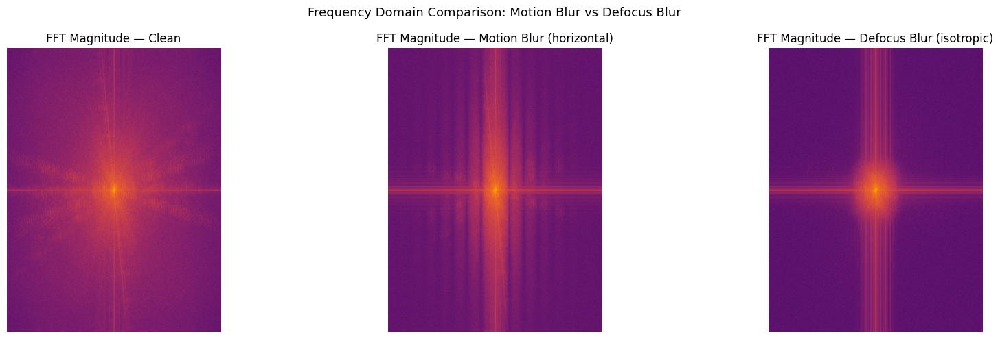

Saved figure to: /kaggle/working/project_outputs/fft_magnitude_blur_comparison.png


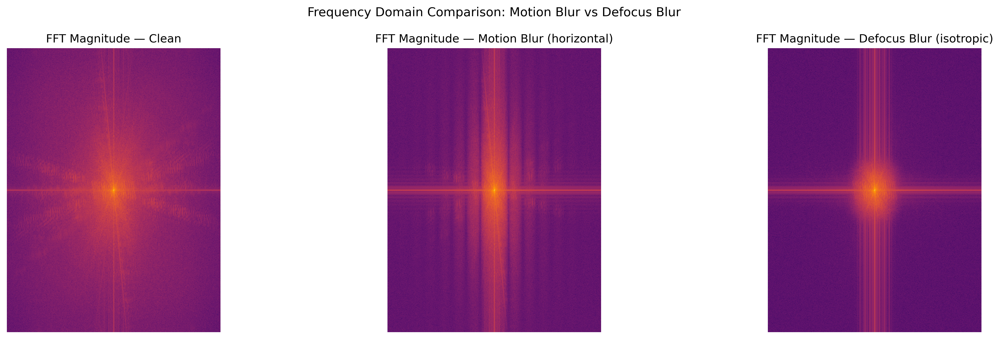

In [35]:
# Frequency domain analysis: motion blur vs. defocus blur.
# This cell computes and visualizes the Fourier magnitude spectrum of three versions
# of the target image: clean, motion-blurred and defocus-blurred.

def compute_fft_magnitude(image_bgr):
    """
    Computes the centered log-magnitude Fourier spectrum of a BGR image.
    The image is first converted to grayscale.
    """
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY).astype(np.float32)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude = np.log1p(np.abs(fshift))
    return magnitude

mag_clean        = compute_fft_magnitude(img2)
mag_motion_blur  = compute_fft_magnitude(img2_motion_blur)
mag_defocus_blur = compute_fft_magnitude(img2_defocus_blur)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].imshow(mag_clean, cmap="inferno")
axes[0].set_title("FFT Magnitude — Clean")
axes[0].axis("off")

axes[1].imshow(mag_motion_blur, cmap="inferno")
axes[1].set_title("FFT Magnitude — Motion Blur (horizontal)")
axes[1].axis("off")

axes[2].imshow(mag_defocus_blur, cmap="inferno")
axes[2].set_title("FFT Magnitude — Defocus Blur (isotropic)")
axes[2].axis("off")

plt.suptitle("Frequency Domain Comparison: Motion Blur vs Defocus Blur", fontsize=13)
plt.tight_layout()

save_path = os.path.join(output_dir, "fft_magnitude_blur_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)
from IPython.display import display, Image as IPImage
display(IPImage(save_path))

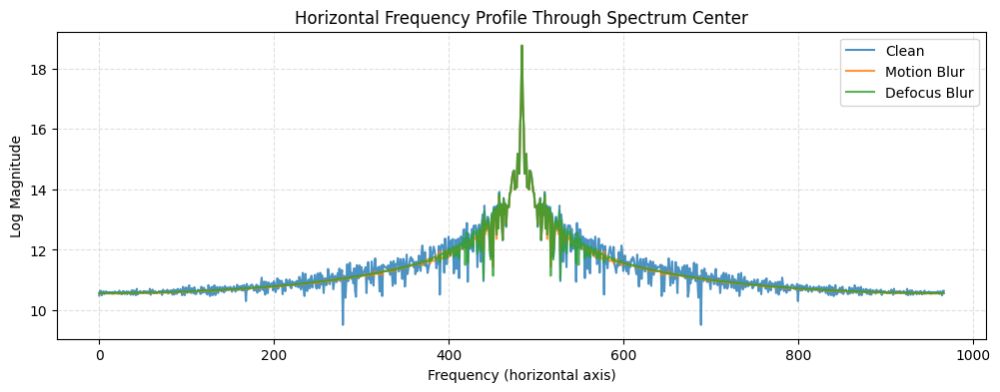

Saved figure to: /kaggle/working/project_outputs/fft_horizontal_profile_blur_comparison.png


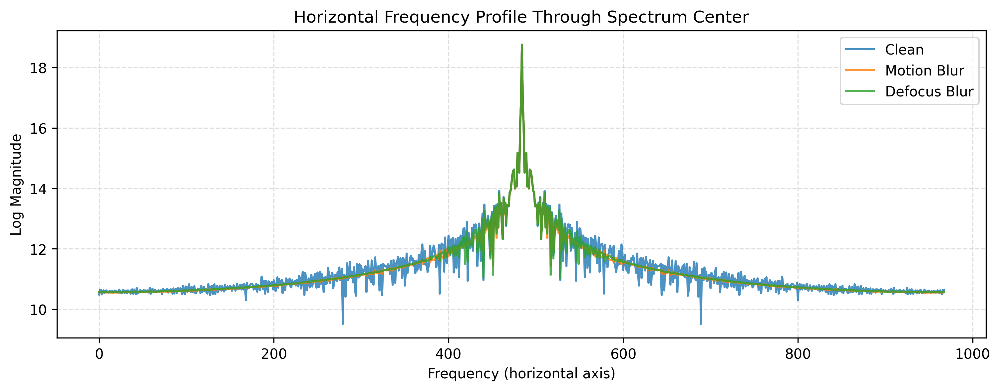

In [36]:
# This cell extracts the horizontal frequency profile through the center of the spectrum.
# Motion blur (horizontal) should show a strong notch pattern along the horizontal axis.
# Defocus blur should show a smooth, symmetric decay without directional notches.

center_row = mag_clean.shape[0] // 2

profile_clean        = mag_clean[center_row, :]
profile_motion_blur  = mag_motion_blur[center_row, :]
profile_defocus_blur = mag_defocus_blur[center_row, :]

x_axis = np.arange(len(profile_clean))

plt.figure(figsize=(12, 4))

plt.plot(x_axis, profile_clean,        label="Clean",        linewidth=1.5, alpha=0.8)
plt.plot(x_axis, profile_motion_blur,  label="Motion Blur",  linewidth=1.5, alpha=0.8)
plt.plot(x_axis, profile_defocus_blur, label="Defocus Blur", linewidth=1.5, alpha=0.8)

plt.xlabel("Frequency (horizontal axis)")
plt.ylabel("Log Magnitude")
plt.title("Horizontal Frequency Profile Through Spectrum Center")
plt.legend()
plt.grid(linestyle="--", alpha=0.4)

save_path = os.path.join(output_dir, "fft_horizontal_profile_blur_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)
from IPython.display import display, Image as IPImage
display(IPImage(save_path))

## 8. Baseline robustness under corruptions

The following tables and plots summarize how the original SIFT + RANSAC baseline behaves under clean, low-light, motion blur and defocus blur conditions.

In [37]:
# Combine clean, low-light, motion blur and defocus blur baseline results.

all_corruption_results_df = pd.concat(
    [
        clean_df,
        low_light_df,
        motion_blur_df,
        defocus_blur_df
    ],
    ignore_index=True,
    sort=False
)

all_corruption_results_df

/tmp/ipykernel_58/2641302265.py:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_corruption_results_df = pd.concat(


,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,gamma,brightness_factor,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score,motion_kernel_size,motion_angle_deg,defocus_kernel_size,defocus_sigma
0,v_weapons,1-2,clean,SIFT + RANSAC,0.75,3.0,NaN,NaN,4355,4118,2072,1958,0.633412,1198.718036,NaN,NaN,NaN,NaN
1,v_weapons,1-2,low_light,SIFT + RANSAC,0.75,3.0,2.0,0.6,4357,2308,1326,1182,0.633949,723.400668,NaN,NaN,NaN,NaN
2,v_weapons,1-2,motion_blur,SIFT + RANSAC,0.75,3.0,NaN,NaN,4357,854,353,192,1.487930,77.172584,15.0,0.0,NaN,NaN
3,v_weapons,1-2,defocus_blur,SIFT + RANSAC,0.75,3.0,NaN,NaN,4357,859,430,316,1.160942,146.232542,NaN,NaN,15.0,3.0


In [38]:
csv_path = os.path.join(output_dir, "all_corruption_results_sift_ransac.csv")

all_corruption_results_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/all_corruption_results_sift_ransac.csv


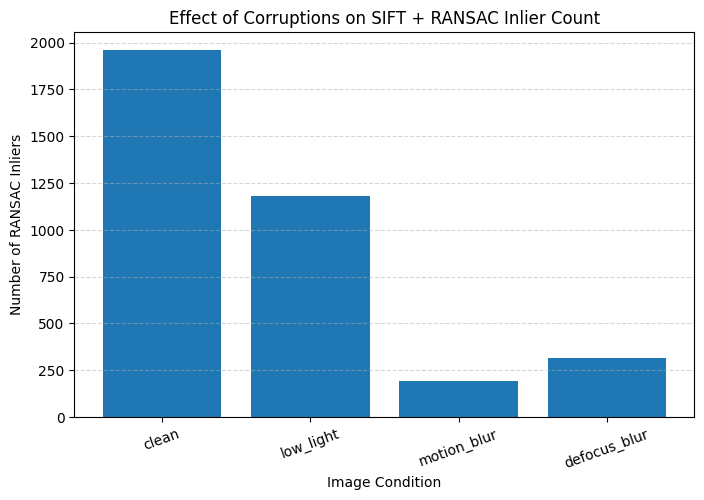

Saved figure to: /kaggle/working/project_outputs/inlier_count_by_corruption.png


In [39]:



plt.figure(figsize=(8, 5))
plt.bar(
    all_corruption_results_df["condition"],
    all_corruption_results_df["ransac_inliers"]
)

plt.xlabel("Image Condition")
plt.ylabel("Number of RANSAC Inliers")
plt.title("Effect of Corruptions on SIFT + RANSAC Inlier Count")
plt.xticks(rotation=20)
plt.grid(axis="y", linestyle="--", alpha=0.5)

save_path = os.path.join(output_dir, "inlier_count_by_corruption.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

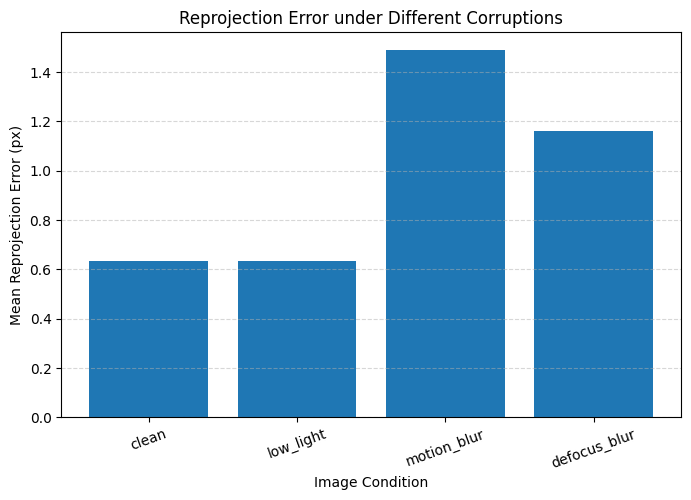

Saved figure to: /kaggle/working/project_outputs/reprojection_error_under_corruptions.png


In [40]:
# Reprojection error

plt.figure(figsize=(8, 5))

plt.bar(
    all_corruption_results_df["condition"],
    all_corruption_results_df["mean_reprojection_error_px"]
)

plt.xlabel("Image Condition")
plt.ylabel("Mean Reprojection Error (px)")
plt.title("Reprojection Error under Different Corruptions")
plt.xticks(rotation=20)
plt.grid(axis="y", linestyle="--", alpha=0.5)

save_path = os.path.join(output_dir, "reprojection_error_under_corruptions.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

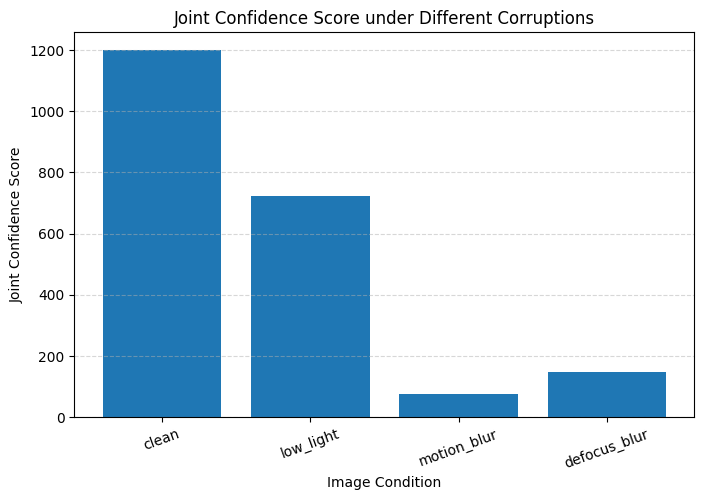

Saved figure to: /kaggle/working/project_outputs/joint_score_under_corruptions.png


In [41]:
# Joint confidence score


plt.figure(figsize=(8, 5))

plt.bar(
    all_corruption_results_df["condition"],
    all_corruption_results_df["joint_confidence_score"]
)

plt.xlabel("Image Condition")
plt.ylabel("Joint Confidence Score")
plt.title("Joint Confidence Score under Different Corruptions")
plt.xticks(rotation=20)
plt.grid(axis="y", linestyle="--", alpha=0.5)

save_path = os.path.join(output_dir, "joint_score_under_corruptions.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

In [42]:
summary_table = all_corruption_results_df[
    [
        "condition",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
].copy()

summary_table

,condition,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,clean,4118,2072,1958,0.633412,1198.718036
1,low_light,2308,1326,1182,0.633949,723.400668
2,motion_blur,854,353,192,1.487930,77.172584
3,defocus_blur,859,430,316,1.160942,146.232542


## 9. CLAHE preprocessing

CLAHE is applied on the luminance channel of the image.  
This keeps color information more stable while improving local contrast.  
It is mainly expected to help low-light images rather than blur-degraded images.

In [43]:
# CLAHE preprocessing function.
# CLAHE is applied only to the luminance channel in LAB color space.


def apply_clahe_bgr(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Applies CLAHE preprocessing to a BGR image.

    CLAHE is applied only to the luminance channel in LAB color space.
    This improves local contrast without strongly changing color information.
    """

    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    l_channel, a_channel, b_channel = cv2.split(lab)

    clahe = cv2.createCLAHE(
        clipLimit=clip_limit,
        tileGridSize=tile_grid_size
    )

    l_clahe = clahe.apply(l_channel)

    lab_clahe = cv2.merge(
        (l_clahe, a_channel, b_channel)
    )

    enhanced_image = cv2.cvtColor(
        lab_clahe,
        cv2.COLOR_LAB2BGR
    )

    return enhanced_image

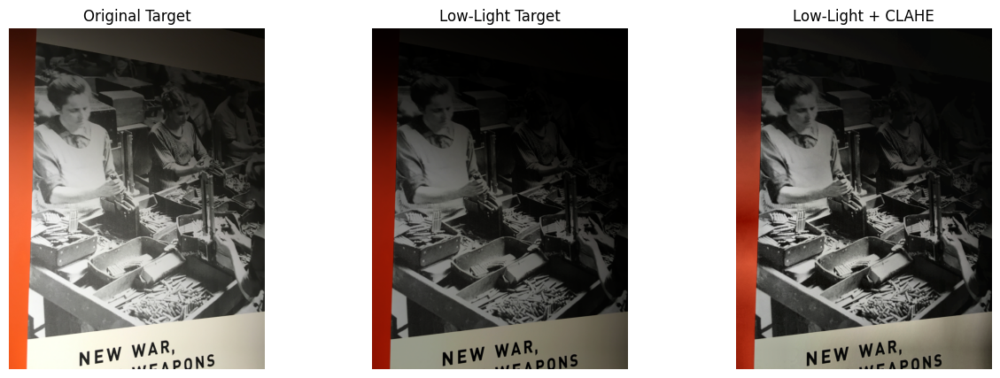

In [44]:
# CLAHE to Low-light image.

img2_low_light_clahe = apply_clahe_bgr(
    img2_low_light,
    clip_limit=2.0,
    tile_grid_size=(8, 8)
)

img2_low_light_clahe_rgb = cv2.cvtColor(img2_low_light_clahe, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img2_rgb)
plt.title("Original Target")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img2_low_light_rgb)
plt.title("Low-Light Target")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img2_low_light_clahe_rgb)
plt.title("Low-Light + CLAHE")
plt.axis("off")

plt.show()

In [45]:
# Evaluate SIFT + RANSAC after applying CLAHE to the low-light image.


kp1_ll_clahe, kp2_ll_clahe, good_matches_ll_clahe, inlier_matches_ll_clahe, mask_ll_clahe, H_est_ll_clahe = sift_match_and_estimate_homography(
    img1,
    img2_low_light_clahe,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_ll_clahe = compute_reprojection_error(
    kp1_ll_clahe,
    kp2_ll_clahe,
    inlier_matches_ll_clahe,
    H_est_ll_clahe
)

joint_score_ll_clahe = joint_confidence_score(
    num_inliers=len(inlier_matches_ll_clahe),
    reprojection_error=reproj_error_ll_clahe
)

print("CLAHE + SIFT + RANSAC Results under Low-Light Corruption")
print("--------------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_ll_clahe))
print("Number of keypoints in low-light + CLAHE image 2:", len(kp2_ll_clahe))
print("Number of good matches after Lowe ratio test:", len(good_matches_ll_clahe))
print("Number of RANSAC inliers:", len(inlier_matches_ll_clahe))
print("Mean reprojection error:", reproj_error_ll_clahe)
print("Joint confidence score:", joint_score_ll_clahe)

print("\nEstimated homography matrix:")
print(H_est_ll_clahe)

CLAHE + SIFT + RANSAC Results under Low-Light Corruption
--------------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in low-light + CLAHE image 2: 3957
Number of good matches after Lowe ratio test: 1583
Number of RANSAC inliers: 1448
Mean reprojection error: 0.698696494102478
Joint confidence score: 852.418313116649

Estimated homography matrix:
[[ 1.33852434e+00  4.90812958e-03  1.53948378e+02]
 [ 3.03403281e-01  1.16016808e+00 -1.03766314e+02]
 [ 3.92973936e-04 -4.98579772e-05  1.00000000e+00]]


In [46]:
low_light_clahe_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "low_light",
    "method": "CLAHE + SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "clahe_clip_limit": 2.0,
    "clahe_tile_grid": "8x8",
    "gamma": 2.0,
    "brightness_factor": 0.6,
    "keypoints_img1": len(kp1_ll_clahe),
    "keypoints_img2": len(kp2_ll_clahe),
    "good_matches": len(good_matches_ll_clahe),
    "ransac_inliers": len(inlier_matches_ll_clahe),
    "mean_reprojection_error_px": reproj_error_ll_clahe,
    "joint_confidence_score": joint_score_ll_clahe
}

low_light_clahe_df = pd.DataFrame([low_light_clahe_result])

low_light_clahe_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,clahe_clip_limit,clahe_tile_grid,gamma,brightness_factor,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,low_light,CLAHE + SIFT + RANSAC,0.75,3.0,2.0,8x8,2.0,0.6,4357,3957,1583,1448,0.698696,852.418313


In [47]:
low_light_comparison_df = pd.concat(
    [
        low_light_df,
        low_light_clahe_df
    ],
    ignore_index=True,
    sort=False
)

low_light_comparison_df[
    [
        "condition",
        "method",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,2308,1326,1182,0.633949,723.400668
1,low_light,CLAHE + SIFT + RANSAC,3957,1583,1448,0.698696,852.418313


In [48]:
# Low-light CLAHE

low_light_comparison_summary = low_light_comparison_df[
    [
        "condition",
        "method",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
].copy()

csv_path = os.path.join(output_dir, "low_light_clahe_comparison.csv")

low_light_comparison_summary.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/low_light_clahe_comparison.csv


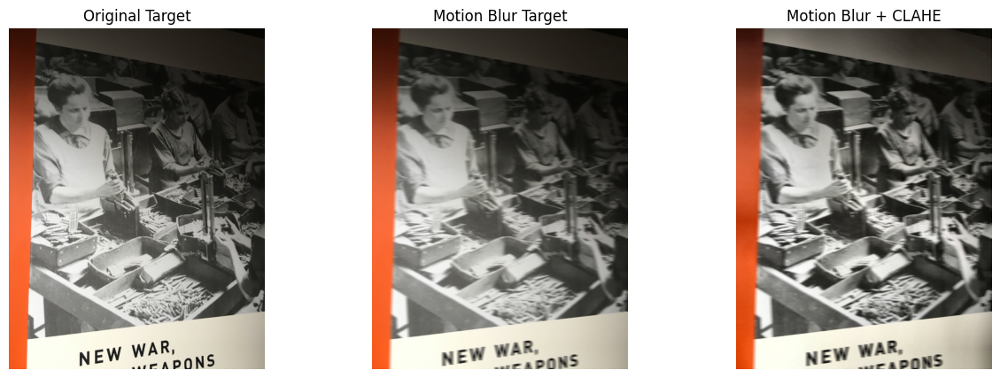

In [49]:
# Motion blur + CLAHE

img2_motion_blur_clahe = apply_clahe_bgr(
    img2_motion_blur,
    clip_limit=2.0,
    tile_grid_size=(8, 8)
)

img2_motion_blur_clahe_rgb = cv2.cvtColor(img2_motion_blur_clahe, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img2_rgb)
plt.title("Original Target")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img2_motion_blur_rgb)
plt.title("Motion Blur Target")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img2_motion_blur_clahe_rgb)
plt.title("Motion Blur + CLAHE")
plt.axis("off")

plt.show()

In [50]:
# Evaluate SIFT + RANSAC after applying CLAHE to the motion-blur image.


kp1_mb_clahe, kp2_mb_clahe, good_matches_mb_clahe, inlier_matches_mb_clahe, mask_mb_clahe, H_est_mb_clahe = sift_match_and_estimate_homography(
    img1,
    img2_motion_blur_clahe,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_mb_clahe = compute_reprojection_error(
    kp1_mb_clahe,
    kp2_mb_clahe,
    inlier_matches_mb_clahe,
    H_est_mb_clahe
)

joint_score_mb_clahe = joint_confidence_score(
    num_inliers=len(inlier_matches_mb_clahe),
    reprojection_error=reproj_error_mb_clahe
)

print("CLAHE + SIFT + RANSAC Results under Motion Blur Corruption")
print("----------------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_mb_clahe))
print("Number of keypoints in motion blur + CLAHE image 2:", len(kp2_mb_clahe))
print("Number of good matches after Lowe ratio test:", len(good_matches_mb_clahe))
print("Number of RANSAC inliers:", len(inlier_matches_mb_clahe))
print("Mean reprojection error:", reproj_error_mb_clahe)
print("Joint confidence score:", joint_score_mb_clahe)

print("\nEstimated homography matrix:")
print(H_est_mb_clahe)

CLAHE + SIFT + RANSAC Results under Motion Blur Corruption
----------------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in motion blur + CLAHE image 2: 1420
Number of good matches after Lowe ratio test: 346
Number of RANSAC inliers: 197
Mean reprojection error: 1.5408854484558105
Joint confidence score: 77.53202731737636

Estimated homography matrix:
[[ 1.33746936e+00  2.05264225e-03  1.56924618e+02]
 [ 3.02335045e-01  1.16536199e+00 -1.05920061e+02]
 [ 3.90421910e-04 -4.67965328e-05  1.00000000e+00]]


In [51]:
motion_blur_clahe_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "motion_blur",
    "method": "CLAHE + SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "clahe_clip_limit": 2.0,
    "clahe_tile_grid": "8x8",
    "motion_kernel_size": 15,
    "motion_angle_deg": 0,
    "keypoints_img1": len(kp1_mb_clahe),
    "keypoints_img2": len(kp2_mb_clahe),
    "good_matches": len(good_matches_mb_clahe),
    "ransac_inliers": len(inlier_matches_mb_clahe),
    "mean_reprojection_error_px": reproj_error_mb_clahe,
    "joint_confidence_score": joint_score_mb_clahe
}

motion_blur_clahe_df = pd.DataFrame([motion_blur_clahe_result])

motion_blur_clahe_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,clahe_clip_limit,clahe_tile_grid,motion_kernel_size,motion_angle_deg,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,motion_blur,CLAHE + SIFT + RANSAC,0.75,3.0,2.0,8x8,15,0,4357,1420,346,197,1.540885,77.532027


In [52]:
motion_blur_comparison_df = pd.concat(
    [
        motion_blur_df,
        motion_blur_clahe_df
    ],
    ignore_index=True,
    sort=False
)

motion_blur_comparison_summary = motion_blur_comparison_df[
    [
        "condition",
        "method",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
].copy()

motion_blur_comparison_summary

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,motion_blur,SIFT + RANSAC,854,353,192,1.487930,77.172584
1,motion_blur,CLAHE + SIFT + RANSAC,1420,346,197,1.540885,77.532027


In [53]:
csv_path = os.path.join(output_dir, "motion_blur_clahe_comparison.csv")

motion_blur_comparison_summary.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/motion_blur_clahe_comparison.csv


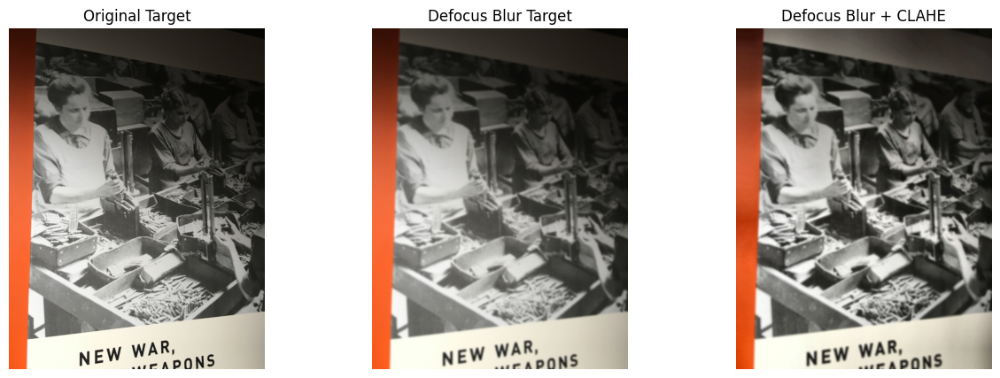

In [54]:
# Defocus blur + CLAHE

img2_defocus_blur_clahe = apply_clahe_bgr(
    img2_defocus_blur,
    clip_limit=2.0,
    tile_grid_size=(8, 8)
)

img2_defocus_blur_clahe_rgb = cv2.cvtColor(img2_defocus_blur_clahe, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img2_rgb)
plt.title("Original Target")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img2_defocus_blur_rgb)
plt.title("Defocus Blur Target")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img2_defocus_blur_clahe_rgb)
plt.title("Defocus Blur + CLAHE")
plt.axis("off")

plt.show()

In [55]:
# Evaluate SIFT + RANSAC after applying CLAHE to the defocus-blur image.


kp1_db_clahe, kp2_db_clahe, good_matches_db_clahe, inlier_matches_db_clahe, mask_db_clahe, H_est_db_clahe = sift_match_and_estimate_homography(
    img1,
    img2_defocus_blur_clahe,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

reproj_error_db_clahe = compute_reprojection_error(
    kp1_db_clahe,
    kp2_db_clahe,
    inlier_matches_db_clahe,
    H_est_db_clahe
)

joint_score_db_clahe = joint_confidence_score(
    num_inliers=len(inlier_matches_db_clahe),
    reprojection_error=reproj_error_db_clahe
)

print("CLAHE + SIFT + RANSAC Results under Defocus Blur Corruption")
print("-----------------------------------------------------------")
print("Number of keypoints in image 1:", len(kp1_db_clahe))
print("Number of keypoints in defocus blur + CLAHE image 2:", len(kp2_db_clahe))
print("Number of good matches after Lowe ratio test:", len(good_matches_db_clahe))
print("Number of RANSAC inliers:", len(inlier_matches_db_clahe))
print("Mean reprojection error:", reproj_error_db_clahe)
print("Joint confidence score:", joint_score_db_clahe)

print("\nEstimated homography matrix:")
print(H_est_db_clahe)

CLAHE + SIFT + RANSAC Results under Defocus Blur Corruption
-----------------------------------------------------------
Number of keypoints in image 1: 4357
Number of keypoints in defocus blur + CLAHE image 2: 1304
Number of good matches after Lowe ratio test: 404
Number of RANSAC inliers: 302
Mean reprojection error: 1.23411226272583
Joint confidence score: 135.17673441867743

Estimated homography matrix:
[[ 1.34116908e+00  5.20884754e-03  1.54560451e+02]
 [ 3.03106247e-01  1.16435211e+00 -1.05172916e+02]
 [ 3.92390909e-04 -4.70891423e-05  1.00000000e+00]]


In [56]:
defocus_blur_clahe_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "defocus_blur",
    "method": "CLAHE + SIFT + RANSAC",
    "ratio_threshold": 0.75,
    "ransac_threshold_px": 3.0,
    "clahe_clip_limit": 2.0,
    "clahe_tile_grid": "8x8",
    "defocus_kernel_size": 15,
    "defocus_sigma": 3.0,
    "keypoints_img1": len(kp1_db_clahe),
    "keypoints_img2": len(kp2_db_clahe),
    "good_matches": len(good_matches_db_clahe),
    "ransac_inliers": len(inlier_matches_db_clahe),
    "mean_reprojection_error_px": reproj_error_db_clahe,
    "joint_confidence_score": joint_score_db_clahe
}

defocus_blur_clahe_df = pd.DataFrame([defocus_blur_clahe_result])

defocus_blur_clahe_df

,sequence,image_pair,condition,method,ratio_threshold,ransac_threshold_px,clahe_clip_limit,clahe_tile_grid,defocus_kernel_size,defocus_sigma,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,defocus_blur,CLAHE + SIFT + RANSAC,0.75,3.0,2.0,8x8,15,3.0,4357,1304,404,302,1.234112,135.176734


In [57]:
defocus_blur_comparison_df = pd.concat(
    [
        defocus_blur_df,
        defocus_blur_clahe_df
    ],
    ignore_index=True,
    sort=False
)

defocus_blur_comparison_summary = defocus_blur_comparison_df[
    [
        "condition",
        "method",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
].copy()

defocus_blur_comparison_summary

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,SIFT + RANSAC,859,430,316,1.160942,146.232542
1,defocus_blur,CLAHE + SIFT + RANSAC,1304,404,302,1.234112,135.176734


In [58]:
csv_path = os.path.join(output_dir, "defocus_blur_clahe_comparison.csv")

defocus_blur_comparison_summary.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/defocus_blur_clahe_comparison.csv


In [59]:
# Combine all CLAHE comparison results into a single table.


clahe_comparison_all = pd.concat(
    [
        low_light_comparison_summary,
        motion_blur_comparison_summary,
        defocus_blur_comparison_summary
    ],
    ignore_index=True,
    sort=False
)

clahe_comparison_all

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,2308,1326,1182,0.633949,723.400668
1,low_light,CLAHE + SIFT + RANSAC,3957,1583,1448,0.698696,852.418313
2,motion_blur,SIFT + RANSAC,854,353,192,1.487930,77.172584
3,motion_blur,CLAHE + SIFT + RANSAC,1420,346,197,1.540885,77.532027
4,defocus_blur,SIFT + RANSAC,859,430,316,1.160942,146.232542
5,defocus_blur,CLAHE + SIFT + RANSAC,1304,404,302,1.234112,135.176734


In [60]:
csv_path = os.path.join(output_dir, "all_clahe_comparisons.csv")

clahe_comparison_all.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/all_clahe_comparisons.csv


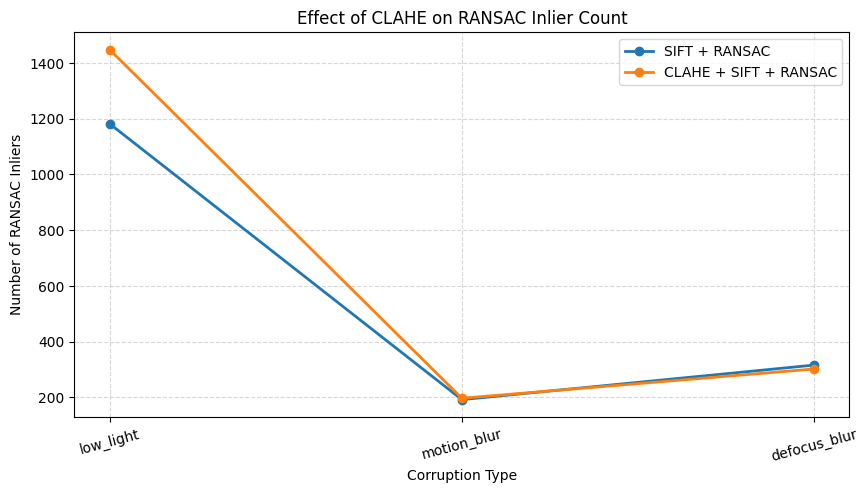

Saved figure to: /kaggle/working/project_outputs/clahe_effect_on_inliers.png


In [61]:
plt.figure(figsize=(10, 5))

for method in clahe_comparison_all["method"].unique():
    subset = clahe_comparison_all[clahe_comparison_all["method"] == method]
    plt.plot(
        subset["condition"],
        subset["ransac_inliers"],
        marker="o",
        linewidth=2,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Number of RANSAC Inliers")
plt.title("Effect of CLAHE on RANSAC Inlier Count")
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.xticks(rotation=15)

save_path = os.path.join(output_dir, "clahe_effect_on_inliers.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

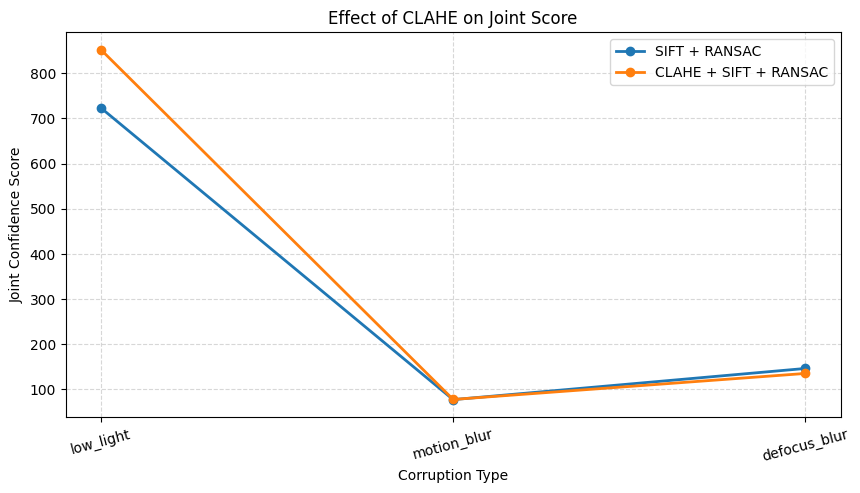

Saved figure to: /kaggle/working/project_outputs/clahe_effect_on_joint_score.png


In [62]:
plt.figure(figsize=(10, 5))

for method in clahe_comparison_all["method"].unique():
    subset = clahe_comparison_all[clahe_comparison_all["method"] == method]
    plt.plot(
        subset["condition"],
        subset["joint_confidence_score"],
        marker="o",
        linewidth=2,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Joint Confidence Score")
plt.title("Effect of CLAHE on Joint Score")
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.xticks(rotation=15)

save_path = os.path.join(output_dir, "clahe_effect_on_joint_score.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

## 10. CLAHE parameter sweep

This section tests different CLAHE settings.  
The purpose is not only to find a good value, but also to justify why the selected CLAHE parameters are used in the proposed method.

In [63]:
# Sweep several CLAHE parameter combinations on the low-light case.


clahe_param_results = []

clahe_settings = [
    {"clip_limit": 1.0, "tile_grid_size": (8, 8)},
    {"clip_limit": 2.0, "tile_grid_size": (8, 8)},
    {"clip_limit": 3.0, "tile_grid_size": (8, 8)},
    {"clip_limit": 2.0, "tile_grid_size": (16, 16)},
    {"clip_limit": 3.0, "tile_grid_size": (16, 16)}
]

for setting in clahe_settings:
    clip_limit = setting["clip_limit"]
    tile_grid_size = setting["tile_grid_size"]

    enhanced_img = apply_clahe_bgr(
        img2_low_light,
        clip_limit=clip_limit,
        tile_grid_size=tile_grid_size
    )

    kp1_temp, kp2_temp, good_matches_temp, inlier_matches_temp, mask_temp, H_est_temp = sift_match_and_estimate_homography(
        img1,
        enhanced_img,
        ratio_thresh=0.75,
        ransac_thresh=3.0
    )

    reproj_error_temp = compute_reprojection_error(
        kp1_temp,
        kp2_temp,
        inlier_matches_temp,
        H_est_temp
    )

    joint_score_temp = joint_confidence_score(
        num_inliers=len(inlier_matches_temp),
        reprojection_error=reproj_error_temp
    )

    clahe_param_results.append({
        "condition": "low_light",
        "method": "CLAHE + SIFT + RANSAC",
        "clahe_clip_limit": clip_limit,
        "clahe_tile_grid": f"{tile_grid_size[0]}x{tile_grid_size[1]}",
        "keypoints_img2": len(kp2_temp),
        "good_matches": len(good_matches_temp),
        "ransac_inliers": len(inlier_matches_temp),
        "mean_reprojection_error_px": reproj_error_temp,
        "joint_confidence_score": joint_score_temp
    })

clahe_param_df = pd.DataFrame(clahe_param_results)

clahe_param_df

,condition,method,clahe_clip_limit,clahe_tile_grid,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,low_light,CLAHE + SIFT + RANSAC,1.0,8x8,3330,1482,1348,0.633915,825.012133
1,low_light,CLAHE + SIFT + RANSAC,2.0,8x8,3957,1582,1443,0.673302,862.366933
2,low_light,CLAHE + SIFT + RANSAC,3.0,8x8,4365,1573,1440,0.656294,869.410778
3,low_light,CLAHE + SIFT + RANSAC,2.0,16x16,4023,1506,1355,0.666368,813.145567
4,low_light,CLAHE + SIFT + RANSAC,3.0,16x16,4601,1521,1373,0.680961,816.794759


In [64]:
csv_path = os.path.join(output_dir, "clahe_parameter_sweep_low_light.csv")

clahe_param_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/clahe_parameter_sweep_low_light.csv


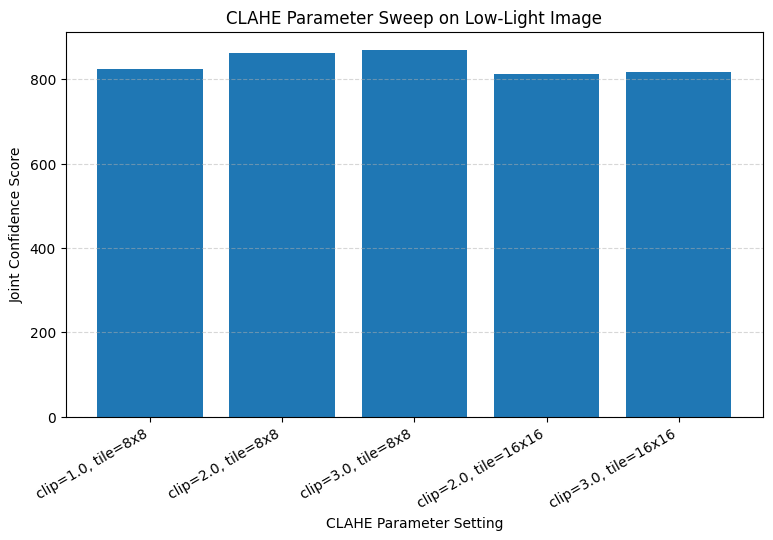

Saved figure to: /kaggle/working/project_outputs/clahe_parameter_sweep_joint_score.png


In [65]:
plt.figure(figsize=(9, 5))

param_labels = (
    "clip=" + clahe_param_df["clahe_clip_limit"].astype(str)
    + ", tile=" + clahe_param_df["clahe_tile_grid"]
)

plt.bar(
    param_labels,
    clahe_param_df["joint_confidence_score"]
)

plt.xlabel("CLAHE Parameter Setting")
plt.ylabel("Joint Confidence Score")
plt.title("CLAHE Parameter Sweep on Low-Light Image")
plt.xticks(rotation=30, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.5)

save_path = os.path.join(output_dir, "clahe_parameter_sweep_joint_score.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

In [66]:
# Select the CLAHE setting with the highest joint confidence score.


best_clahe_row = clahe_param_df.loc[
    clahe_param_df["joint_confidence_score"].idxmax()
]

best_clahe_row

condition                                 low_light
method                        CLAHE + SIFT + RANSAC
clahe_clip_limit                                3.0
clahe_tile_grid                                 8x8
keypoints_img2                                 4365
good_matches                                   1573
ransac_inliers                                 1440
mean_reprojection_error_px                 0.656294
joint_confidence_score                   869.410778
Name: 2, dtype: object

In [67]:
# Store the selected CLAHE parameters so the proposed method uses the same values everywhere.


BEST_CLAHE_CLIP_LIMIT = float(best_clahe_row["clahe_clip_limit"])

tile_text = best_clahe_row["clahe_tile_grid"]
BEST_CLAHE_TILE_GRID = tuple(map(int, tile_text.split("x")))

print("Best CLAHE clip limit:", BEST_CLAHE_CLIP_LIMIT)
print("Best CLAHE tile grid:", BEST_CLAHE_TILE_GRID)

Best CLAHE clip limit: 3.0
Best CLAHE tile grid: (8, 8)


### CLAHE effect on blur corruptions

The previous sweep was performed on the low-light condition because CLAHE is primarily designed to improve local contrast in underexposed images. 
The key aspect is that CLAHE operates in the spatial domain on the luminance channel and redistributes pixel intensities within local tiles. It can recover contrast that was lost due to poor illumination.
Motion blur and defocus blur, on the other hand, destroy high-frequency gradient information that CLAHE cannot recover. CLAHE can slightly improve the visual appearance of a blurred image by enhancing the remaining low-frequency contrast, but it cannot reconstruct the suppressed high-frequency edges that SIFT and SuperPoint rely on.
The following cells confirm this by running the same CLAHE sweep on the motion-blur and defocus-blur conditions and comparing the joint confidence scores.

In [68]:
# CLAHE parameter sweep on the motion-blur condition.
# This confirms whether CLAHE helps or not when the corruption is directional blur.

clahe_blur_results = []

for setting in clahe_settings:
    clip_limit = setting["clip_limit"]
    tile_grid_size = setting["tile_grid_size"]

    enhanced_mb = apply_clahe_bgr(
        img2_motion_blur,
        clip_limit=clip_limit,
        tile_grid_size=tile_grid_size
    )

    kp1_t, kp2_t, gm_t, im_t, mask_t, H_t = sift_match_and_estimate_homography(
        img1,
        enhanced_mb,
        ratio_thresh=0.75,
        ransac_thresh=3.0
    )

    re_t = compute_reprojection_error(kp1_t, kp2_t, im_t, H_t)
    js_t = joint_confidence_score(num_inliers=len(im_t), reprojection_error=re_t)

    clahe_blur_results.append({
        "condition": "motion_blur",
        "clahe_clip_limit": clip_limit,
        "clahe_tile_grid": f"{tile_grid_size[0]}x{tile_grid_size[1]}",
        "ransac_inliers": len(im_t),
        "mean_reprojection_error_px": re_t,
        "joint_confidence_score": js_t
    })

# Defocus blur sweep
for setting in clahe_settings:
    clip_limit = setting["clip_limit"]
    tile_grid_size = setting["tile_grid_size"]

    enhanced_db = apply_clahe_bgr(
        img2_defocus_blur,
        clip_limit=clip_limit,
        tile_grid_size=tile_grid_size
    )

    kp1_t, kp2_t, gm_t, im_t, mask_t, H_t = sift_match_and_estimate_homography(
        img1,
        enhanced_db,
        ratio_thresh=0.75,
        ransac_thresh=3.0
    )

    re_t = compute_reprojection_error(kp1_t, kp2_t, im_t, H_t)
    js_t = joint_confidence_score(num_inliers=len(im_t), reprojection_error=re_t)

    clahe_blur_results.append({
        "condition": "defocus_blur",
        "clahe_clip_limit": clip_limit,
        "clahe_tile_grid": f"{tile_grid_size[0]}x{tile_grid_size[1]}",
        "ransac_inliers": len(im_t),
        "mean_reprojection_error_px": re_t,
        "joint_confidence_score": js_t
    })

clahe_blur_df = pd.DataFrame(clahe_blur_results)
clahe_blur_df

,condition,clahe_clip_limit,clahe_tile_grid,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,motion_blur,1.0,8x8,190,1.561682,74.170032
1,motion_blur,2.0,8x8,195,1.476290,78.746839
2,motion_blur,3.0,8x8,168,1.486952,67.552569
3,motion_blur,2.0,16x16,186,1.477212,75.084411
4,motion_blur,3.0,16x16,150,1.554164,58.727627
5,defocus_blur,1.0,8x8,327,1.173791,150.428466
6,defocus_blur,2.0,8x8,302,1.234112,135.176734
7,defocus_blur,3.0,8x8,270,1.263788,119.269095
8,defocus_blur,2.0,16x16,298,1.212228,134.705851
9,defocus_blur,3.0,16x16,262,1.325374,112.670059


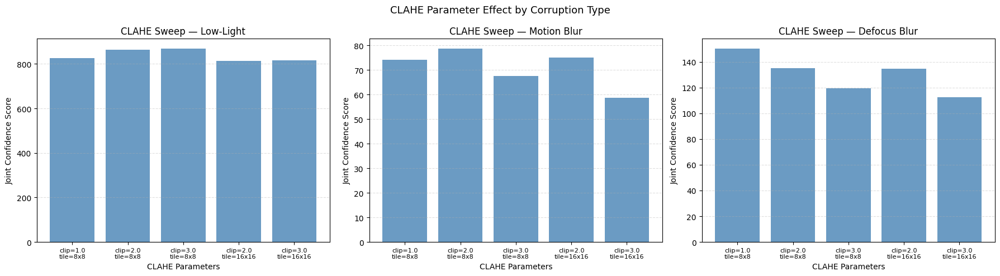

Saved figure to: /kaggle/working/project_outputs/clahe_sweep_all_corruption_types.png


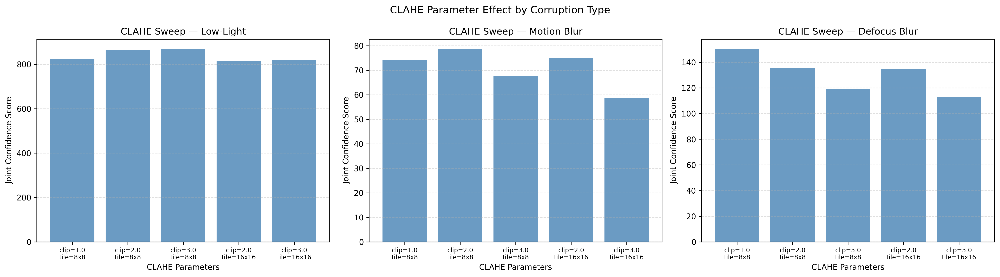

In [69]:
# Compare CLAHE sweep results across all three corruption types.
# This visualization justifies why CLAHE is beneficial for low-light but not for blur.

# Add condition column to low-light sweep for combining
clahe_param_df_labeled = clahe_param_df.copy()
clahe_param_df_labeled["condition"] = "low_light"

# Keep only matching columns
cols = ["condition", "clahe_clip_limit", "clahe_tile_grid", "joint_confidence_score"]
clahe_all_conditions = pd.concat(
    [clahe_param_df_labeled[cols], clahe_blur_df[cols]],
    ignore_index=True
)

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

conditions = ["low_light", "motion_blur", "defocus_blur"]
titles = ["Low-Light", "Motion Blur", "Defocus Blur"]

for ax, cond, title in zip(axes, conditions, titles):
    subset = clahe_all_conditions[clahe_all_conditions["condition"] == cond]
    labels = "clip=" + subset["clahe_clip_limit"].astype(str) + "\ntile=" + subset["clahe_tile_grid"]
    ax.bar(labels, subset["joint_confidence_score"], color="steelblue", alpha=0.8)
    ax.set_title(f"CLAHE Sweep — {title}")
    ax.set_xlabel("CLAHE Parameters")
    ax.set_ylabel("Joint Confidence Score")
    ax.tick_params(axis="x", labelsize=8)
    ax.grid(axis="y", linestyle="--", alpha=0.4)

plt.suptitle("CLAHE Parameter Effect by Corruption Type", fontsize=13)
plt.tight_layout()

save_path = os.path.join(output_dir, "clahe_sweep_all_corruption_types.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)
from IPython.display import display, Image as IPImage
display(IPImage(save_path))

In [70]:
# Save the combined CLAHE sweep results.
csv_path = os.path.join(output_dir, "clahe_sweep_all_conditions.csv")
clahe_all_conditions.to_csv(csv_path, index=False)
print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/clahe_sweep_all_conditions.csv


## 11. Proposed SIFT-based method: CLAHE + multi-scale SIFT + RANSAC

The proposed SIFT-based version applies CLAHE and then tests multiple image scales.  
The best scale is selected using the joint confidence score.  
This implements the main idea of selecting the most reliable homography instead of relying on a single fixed scale.

In [71]:
# Multi-scale helper functions.
# The method tests several image scales and keeps the result with the highest joint confidence score.

def resize_image(image, scale):
    """
    Resizes an image by a given scale factor.
    """

    if scale == 1.0:
        return image.copy()

    new_width = int(image.shape[1] * scale)
    new_height = int(image.shape[0] * scale)

    resized = cv2.resize(
        image,
        (new_width, new_height),
        interpolation=cv2.INTER_LINEAR
    )

    return resized


def run_multiscale_sift_ransac(
    img1,
    img2,
    scales=[1.0, 1.25, 1.5],
    use_clahe=True,
    clahe_clip_limit=3.0,
    clahe_tile_grid=(8, 8),
    ratio_thresh=0.75,
    ransac_thresh=3.0
):
    """
    Runs SIFT + RANSAC at multiple image scales.

    If use_clahe=True, CLAHE is applied to the target image before scaling.
    The best scale is selected using the joint confidence score.
    """

    results = []

    if use_clahe:
        img2_processed = apply_clahe_bgr(
            img2,
            clip_limit=clahe_clip_limit,
            tile_grid_size=clahe_tile_grid
        )
    else:
        img2_processed = img2.copy()

    for scale in scales:
        img1_scaled = resize_image(img1, scale)
        img2_scaled = resize_image(img2_processed, scale)

        kp1_s, kp2_s, good_matches_s, inlier_matches_s, mask_s, H_est_s = sift_match_and_estimate_homography(
            img1_scaled,
            img2_scaled,
            ratio_thresh=ratio_thresh,
            ransac_thresh=ransac_thresh * scale
        )

        reproj_error_scaled = compute_reprojection_error(
            kp1_s,
            kp2_s,
            inlier_matches_s,
            H_est_s
        )

        if reproj_error_scaled != np.inf:
            reproj_error_original_scale = reproj_error_scaled / scale
        else:
            reproj_error_original_scale = np.inf

        joint_score_s = joint_confidence_score(
            num_inliers=len(inlier_matches_s),
            reprojection_error=reproj_error_original_scale
        )

        results.append({
            "scale": scale,
            "use_clahe": use_clahe,
            "clahe_clip_limit": clahe_clip_limit if use_clahe else None,
            "clahe_tile_grid": f"{clahe_tile_grid[0]}x{clahe_tile_grid[1]}" if use_clahe else None,
            "keypoints_img1": len(kp1_s),
            "keypoints_img2": len(kp2_s),
            "good_matches": len(good_matches_s),
            "ransac_inliers": len(inlier_matches_s),
            "mean_reprojection_error_px": reproj_error_original_scale,
            "joint_confidence_score": joint_score_s,
            "H_est_scaled": H_est_s
        })

    results_df = pd.DataFrame(results)

    best_idx = results_df["joint_confidence_score"].idxmax()
    best_result = results_df.loc[best_idx]

    return results_df, best_result

In [72]:
# Run the proposed multi-scale method on the low-light image.


multiscale_ll_df, best_multiscale_ll = run_multiscale_sift_ransac(
    img1=img1,
    img2=img2_low_light,
    scales=[1.0, 1.25, 1.5],
    use_clahe=True,
    clahe_clip_limit=BEST_CLAHE_CLIP_LIMIT,
    clahe_tile_grid=BEST_CLAHE_TILE_GRID,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

multiscale_ll_df[
    [
        "scale",
        "use_clahe",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]


,scale,use_clahe,clahe_clip_limit,clahe_tile_grid,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,1.00,True,3.0,8x8,4366,1573,1440,0.656294,869.410778
1,1.25,True,3.0,8x8,4121,1620,1459,0.650717,883.858286
2,1.50,True,3.0,8x8,4177,1615,1495,0.617702,924.150268


In [73]:
best_multiscale_ll

scale                                                                       1.5
use_clahe                                                                  True
clahe_clip_limit                                                            3.0
clahe_tile_grid                                                             8x8
keypoints_img1                                                             4465
keypoints_img2                                                             4177
good_matches                                                               1615
ransac_inliers                                                             1495
mean_reprojection_error_px                                             0.617702
joint_confidence_score                                               924.150268
H_est_scaled                  [[1.3362347365235308, 0.0050578063447049345, 2...
Name: 2, dtype: object

In [74]:
multiscale_ll_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "low_light",
    "method": "CLAHE + Multi-scale SIFT + RANSAC",
    "best_scale": float(best_multiscale_ll["scale"]),
    "clahe_clip_limit": BEST_CLAHE_CLIP_LIMIT,
    "clahe_tile_grid": f"{BEST_CLAHE_TILE_GRID[0]}x{BEST_CLAHE_TILE_GRID[1]}",
    "keypoints_img1": int(best_multiscale_ll["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_ll["keypoints_img2"]),
    "good_matches": int(best_multiscale_ll["good_matches"]),
    "ransac_inliers": int(best_multiscale_ll["ransac_inliers"]),
    "mean_reprojection_error_px": float(best_multiscale_ll["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_ll["joint_confidence_score"])
}

multiscale_ll_df_final = pd.DataFrame([multiscale_ll_result])

multiscale_ll_df_final

,sequence,image_pair,condition,method,best_scale,clahe_clip_limit,clahe_tile_grid,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,low_light,CLAHE + Multi-scale SIFT + RANSAC,1.5,3.0,8x8,4465,4177,1615,1495,0.617702,924.150268


In [75]:
# Compare low-light baseline, CLAHE and CLAHE + multi-scale results.


low_light_final_comparison = pd.concat(
    [
        low_light_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        low_light_clahe_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        multiscale_ll_df_final[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True
)

low_light_final_comparison

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,2308,1326,1182,0.633949,723.400668
1,low_light,CLAHE + SIFT + RANSAC,3957,1583,1448,0.698696,852.418313
2,low_light,CLAHE + Multi-scale SIFT + RANSAC,4177,1615,1495,0.617702,924.150268


In [76]:
csv_path = os.path.join(output_dir, "low_light_final_method_comparison.csv")

low_light_final_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/low_light_final_method_comparison.csv


In [77]:
# Run the proposed multi-scale method on the motion-blur image.


multiscale_mb_df, best_multiscale_mb = run_multiscale_sift_ransac(
    img1=img1,
    img2=img2_motion_blur,
    scales=[1.0, 1.25, 1.5],
    use_clahe=True,
    clahe_clip_limit=BEST_CLAHE_CLIP_LIMIT,
    clahe_tile_grid=BEST_CLAHE_TILE_GRID,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

multiscale_mb_df[
    [
        "scale",
        "use_clahe",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,scale,use_clahe,clahe_clip_limit,clahe_tile_grid,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,1.00,True,3.0,8x8,1521,347,168,1.486952,67.552569
1,1.25,True,3.0,8x8,1437,336,153,1.599171,58.864932
2,1.50,True,3.0,8x8,1476,333,164,1.452466,66.871480


In [78]:
best_multiscale_mb

scale                                                                       1.0
use_clahe                                                                  True
clahe_clip_limit                                                            3.0
clahe_tile_grid                                                             8x8
keypoints_img1                                                             4356
keypoints_img2                                                             1521
good_matches                                                                347
ransac_inliers                                                              168
mean_reprojection_error_px                                             1.486952
joint_confidence_score                                                67.552569
H_est_scaled                  [[1.3427082307798186, 0.004721192339008974, 15...
Name: 0, dtype: object

In [79]:
multiscale_mb_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "motion_blur",
    "method": "CLAHE + Multi-scale SIFT + RANSAC",
    "best_scale": float(best_multiscale_mb["scale"]),
    "clahe_clip_limit": BEST_CLAHE_CLIP_LIMIT,
    "clahe_tile_grid": f"{BEST_CLAHE_TILE_GRID[0]}x{BEST_CLAHE_TILE_GRID[1]}",
    "keypoints_img1": int(best_multiscale_mb["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_mb["keypoints_img2"]),
    "good_matches": int(best_multiscale_mb["good_matches"]),
    "ransac_inliers": int(best_multiscale_mb["ransac_inliers"]),
    "mean_reprojection_error_px": float(best_multiscale_mb["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_mb["joint_confidence_score"])
}

multiscale_mb_df_final = pd.DataFrame([multiscale_mb_result])

multiscale_mb_df_final

,sequence,image_pair,condition,method,best_scale,clahe_clip_limit,clahe_tile_grid,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,1.0,3.0,8x8,4356,1521,347,168,1.486952,67.552569


In [80]:
# Compare motion-blur baseline, CLAHE and CLAHE + multi-scale results.


motion_blur_final_comparison = pd.concat(
    [
        motion_blur_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        motion_blur_clahe_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        multiscale_mb_df_final[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True
)

motion_blur_final_comparison

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,motion_blur,SIFT + RANSAC,854,353,192,1.487930,77.172584
1,motion_blur,CLAHE + SIFT + RANSAC,1420,346,197,1.540885,77.532027
2,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,1521,347,168,1.486952,67.552569


In [81]:
csv_path = os.path.join(output_dir, "motion_blur_final_method_comparison.csv")

motion_blur_final_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/motion_blur_final_method_comparison.csv


In [82]:
# Run the proposed multi-scale method on the defocus-blur image.


multiscale_db_df, best_multiscale_db = run_multiscale_sift_ransac(
    img1=img1,
    img2=img2_defocus_blur,
    scales=[1.0, 1.25, 1.5],
    use_clahe=True,
    clahe_clip_limit=BEST_CLAHE_CLIP_LIMIT,
    clahe_tile_grid=BEST_CLAHE_TILE_GRID,
    ratio_thresh=0.75,
    ransac_thresh=3.0
)

multiscale_db_df[
    [
        "scale",
        "use_clahe",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "keypoints_img2",
        "good_matches",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,scale,use_clahe,clahe_clip_limit,clahe_tile_grid,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,1.00,True,3.0,8x8,1351,417,275,1.263048,121.517507
1,1.25,True,3.0,8x8,1297,369,252,1.196342,114.736255
2,1.50,True,3.0,8x8,1316,369,249,1.249575,110.687564


In [83]:
best_multiscale_db

scale                                                                       1.0
use_clahe                                                                  True
clahe_clip_limit                                                            3.0
clahe_tile_grid                                                             8x8
keypoints_img1                                                             4356
keypoints_img2                                                             1351
good_matches                                                                417
ransac_inliers                                                              275
mean_reprojection_error_px                                             1.263048
joint_confidence_score                                               121.517507
H_est_scaled                  [[1.3419871146152846, 0.006192977398894189, 15...
Name: 0, dtype: object

In [84]:
multiscale_db_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "defocus_blur",
    "method": "CLAHE + Multi-scale SIFT + RANSAC",
    "best_scale": float(best_multiscale_db["scale"]),
    "clahe_clip_limit": BEST_CLAHE_CLIP_LIMIT,
    "clahe_tile_grid": f"{BEST_CLAHE_TILE_GRID[0]}x{BEST_CLAHE_TILE_GRID[1]}",
    "keypoints_img1": int(best_multiscale_db["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_db["keypoints_img2"]),
    "good_matches": int(best_multiscale_db["good_matches"]),
    "ransac_inliers": int(best_multiscale_db["ransac_inliers"]),
    "mean_reprojection_error_px": float(best_multiscale_db["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_db["joint_confidence_score"])
}

multiscale_db_df_final = pd.DataFrame([multiscale_db_result])

multiscale_db_df_final

,sequence,image_pair,condition,method,best_scale,clahe_clip_limit,clahe_tile_grid,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,1.0,3.0,8x8,4356,1351,417,275,1.263048,121.517507


In [85]:
# Compare defocus-blur baseline, CLAHE and CLAHE + multi-scale results.


defocus_blur_final_comparison = pd.concat(
    [
        defocus_blur_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        defocus_blur_clahe_df[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        multiscale_db_df_final[
            [
                "condition",
                "method",
                "keypoints_img2",
                "good_matches",
                "ransac_inliers",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True
)

defocus_blur_final_comparison

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,SIFT + RANSAC,859,430,316,1.160942,146.232542
1,defocus_blur,CLAHE + SIFT + RANSAC,1304,404,302,1.234112,135.176734
2,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,1351,417,275,1.263048,121.517507


In [86]:
csv_path = os.path.join(output_dir, "defocus_blur_final_method_comparison.csv")

defocus_blur_final_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/defocus_blur_final_method_comparison.csv


## 12. Final comparison across corruption types

This section combines the final low-light, motion blur and defocus blur results into one table.  
The comparison shows where the proposed method helps and where it does not

In [87]:
# Build the overall final comparison table for all corruptions and methods.


overall_final_comparison = pd.concat(
    [
        low_light_final_comparison,
        motion_blur_final_comparison,
        defocus_blur_final_comparison
    ],
    ignore_index=True
)

overall_final_comparison

,condition,method,keypoints_img2,good_matches,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,2308,1326,1182,0.633949,723.400668
1,low_light,CLAHE + SIFT + RANSAC,3957,1583,1448,0.698696,852.418313
2,low_light,CLAHE + Multi-scale SIFT + RANSAC,4177,1615,1495,0.617702,924.150268
3,motion_blur,SIFT + RANSAC,854,353,192,1.487930,77.172584
4,motion_blur,CLAHE + SIFT + RANSAC,1420,346,197,1.540885,77.532027
5,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,1521,347,168,1.486952,67.552569
6,defocus_blur,SIFT + RANSAC,859,430,316,1.160942,146.232542
7,defocus_blur,CLAHE + SIFT + RANSAC,1304,404,302,1.234112,135.176734
8,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,1351,417,275,1.263048,121.517507


In [88]:
csv_path = os.path.join(output_dir, "overall_final_method_comparison.csv")

overall_final_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/overall_final_method_comparison.csv


## 13. Final result plots

The next plots are designed for the report.  
They compare the methods using joint confidence score, RANSAC inlier count and mean reprojection error.

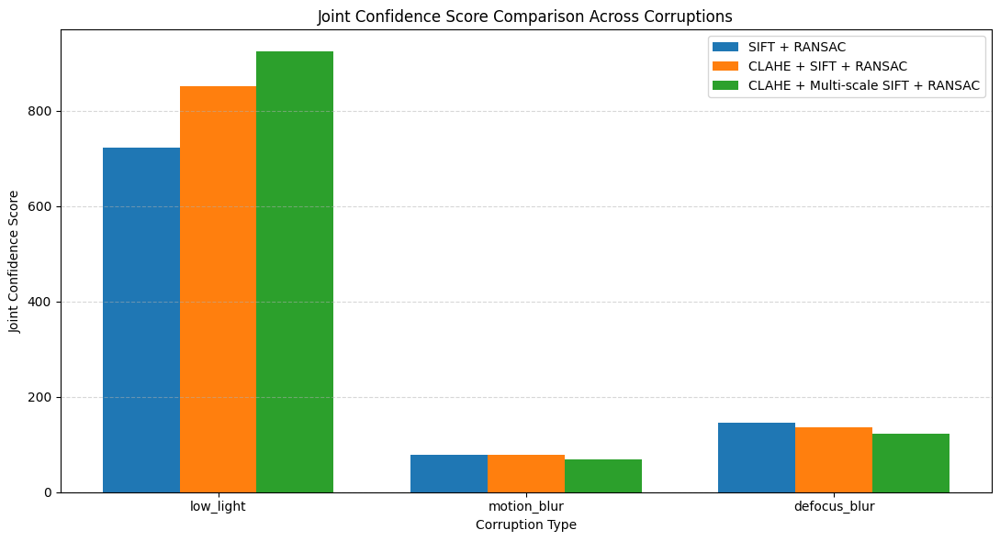

Saved figure to: /kaggle/working/project_outputs/final_joint_confidence_score_comparison.png


In [89]:
# Final plot 1: joint confidence score.
# Higher values indicate stronger overall homography confidence


plt.figure(figsize=(11, 6))

methods = overall_final_comparison["method"].unique()
conditions = overall_final_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = overall_final_comparison[
        overall_final_comparison["method"] == method
    ]

    plt.bar(
        x + i * bar_width,
        subset["joint_confidence_score"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Joint Confidence Score")
plt.title("Joint Confidence Score Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_joint_confidence_score_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

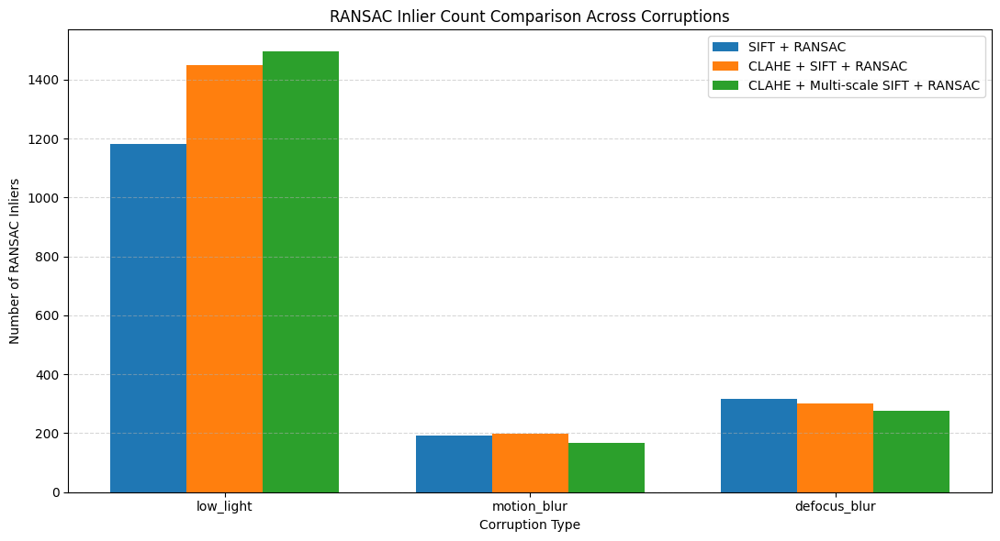

Saved figure to: /kaggle/working/project_outputs/final_ransac_inlier_count_comparison.png


In [90]:
# Final plot 2: RANSAC inlier count.
# This shows how many geometrically consistent matches remain.


plt.figure(figsize=(11, 6))

methods = overall_final_comparison["method"].unique()
conditions = overall_final_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = overall_final_comparison[
        overall_final_comparison["method"] == method
    ]

    plt.bar(
        x + i * bar_width,
        subset["ransac_inliers"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Number of RANSAC Inliers")
plt.title("RANSAC Inlier Count Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_ransac_inlier_count_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

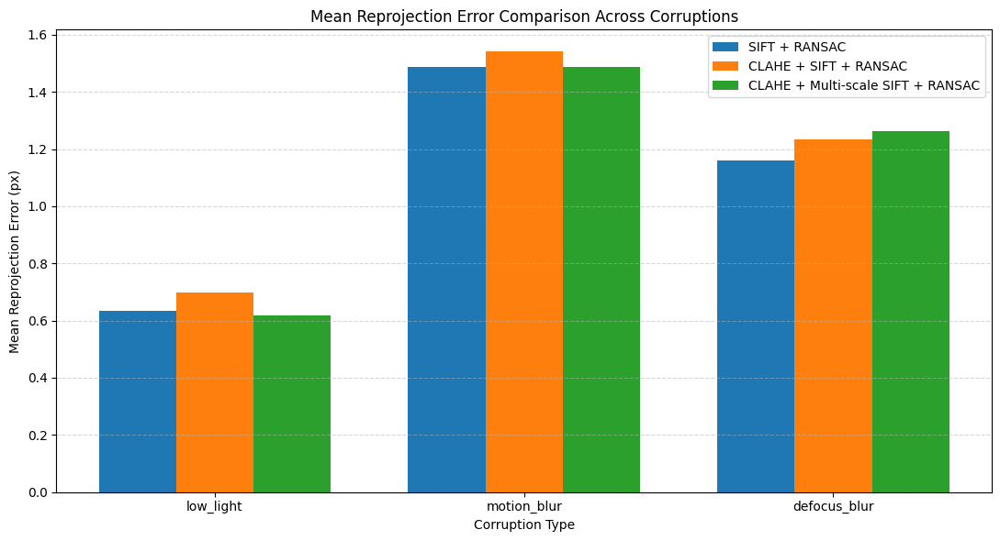

Saved figure to: /kaggle/working/project_outputs/final_reprojection_error_comparison.png


In [91]:
# Final plot 3: mean reprojection error.
# Lower values indicate better geometric accuracy.


plt.figure(figsize=(11, 6))

methods = overall_final_comparison["method"].unique()
conditions = overall_final_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = overall_final_comparison[
        overall_final_comparison["method"] == method
    ]

    plt.bar(
        x + i * bar_width,
        subset["mean_reprojection_error_px"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Mean Reprojection Error (px)")
plt.title("Mean Reprojection Error Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_reprojection_error_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

## 14. Best method per corruption type

This summary automatically selects the best method for each corruption type using the joint confidence score.

In [92]:
# Automatically select the best method for each corruption type.


best_methods_by_condition = overall_final_comparison.loc[
    overall_final_comparison.groupby("condition")["joint_confidence_score"].idxmax()
].reset_index(drop=True)

best_methods_by_condition[
    [
        "condition",
        "method",
        "ransac_inliers",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,ransac_inliers,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,SIFT + RANSAC,316,1.160942,146.232542
1,low_light,CLAHE + Multi-scale SIFT + RANSAC,1495,0.617702,924.150268
2,motion_blur,CLAHE + SIFT + RANSAC,197,1.540885,77.532027


In [93]:
csv_path = os.path.join(output_dir, "best_methods_by_condition.csv")

best_methods_by_condition.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/best_methods_by_condition.csv


## 15. Matching score and robustness drop

This section adds two extra proposal metrics:

- **Matching score:** RANSAC inliers divided by good matches.
- **Robustness drop:** performance loss relative to the clean SIFT baseline.

In [94]:
# Add matching score.
# This measures the fraction of good matches that survive RANSAC.


overall_final_comparison_with_scores = overall_final_comparison.copy()

overall_final_comparison_with_scores["matching_score"] = (
    overall_final_comparison_with_scores["ransac_inliers"]
    / overall_final_comparison_with_scores["good_matches"]
)

overall_final_comparison_with_scores[
    [
        "condition",
        "method",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,1326,1182,0.891403,0.633949,723.400668
1,low_light,CLAHE + SIFT + RANSAC,1583,1448,0.914719,0.698696,852.418313
2,low_light,CLAHE + Multi-scale SIFT + RANSAC,1615,1495,0.925697,0.617702,924.150268
3,motion_blur,SIFT + RANSAC,353,192,0.543909,1.487930,77.172584
4,motion_blur,CLAHE + SIFT + RANSAC,346,197,0.569364,1.540885,77.532027
5,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,347,168,0.484150,1.486952,67.552569
6,defocus_blur,SIFT + RANSAC,430,316,0.734884,1.160942,146.232542
7,defocus_blur,CLAHE + SIFT + RANSAC,404,302,0.747525,1.234112,135.176734
8,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,417,275,0.659472,1.263048,121.517507


In [95]:
csv_path = os.path.join(output_dir, "overall_final_method_comparison_with_matching_score.csv")

overall_final_comparison_with_scores.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/overall_final_method_comparison_with_matching_score.csv


In [96]:
# Add robustness drop relative to the clean baseline.
# Lower drop means the method stays closer to clean-image performance.


clean_joint_score = float(clean_df["joint_confidence_score"].iloc[0])

overall_final_comparison_with_scores["robustness_drop_percent"] = (
    (clean_joint_score - overall_final_comparison_with_scores["joint_confidence_score"])
    / clean_joint_score
) * 100

overall_final_comparison_with_scores[
    [
        "condition",
        "method",
        "joint_confidence_score",
        "robustness_drop_percent",
        "matching_score"
    ]
]

,condition,method,joint_confidence_score,robustness_drop_percent,matching_score
0,low_light,SIFT + RANSAC,723.400668,39.652141,0.891403
1,low_light,CLAHE + SIFT + RANSAC,852.418313,28.889173,0.914719
2,low_light,CLAHE + Multi-scale SIFT + RANSAC,924.150268,22.905117,0.925697
3,motion_blur,SIFT + RANSAC,77.172584,93.562074,0.543909
4,motion_blur,CLAHE + SIFT + RANSAC,77.532027,93.532088,0.569364
5,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,67.552569,94.364599,0.484150
6,defocus_blur,SIFT + RANSAC,146.232542,87.800923,0.734884
7,defocus_blur,CLAHE + SIFT + RANSAC,135.176734,88.723225,0.747525
8,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,121.517507,89.862711,0.659472


In [97]:
csv_path = os.path.join(output_dir, "overall_final_method_comparison_with_scores_and_robustness.csv")

overall_final_comparison_with_scores.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/overall_final_method_comparison_with_scores_and_robustness.csv


## 16. Threshold sweep for SIFT + RANSAC

This section tests the Lowe ratio threshold and RANSAC reprojection threshold.  
The goal is to check whether the default setting is reasonable and to find the strongest optimized SIFT baseline for each corruption type.

In [98]:
# Threshold sweep for baseline SIFT.
# This tests whether different Lowe ratio and RANSAC thresholds improve performance.


ratio_thresholds = [0.70, 0.75, 0.80]
ransac_thresholds = [1.0, 3.0, 5.0]

corrupted_images = {
    "low_light": img2_low_light,
    "motion_blur": img2_motion_blur,
    "defocus_blur": img2_defocus_blur
}

threshold_sweep_results = []

for condition_name, corrupted_img in corrupted_images.items():
    for ratio_thresh in ratio_thresholds:
        for ransac_thresh in ransac_thresholds:

            kp1_t, kp2_t, good_matches_t, inlier_matches_t, mask_t, H_est_t = sift_match_and_estimate_homography(
                img1,
                corrupted_img,
                ratio_thresh=ratio_thresh,
                ransac_thresh=ransac_thresh
            )

            reproj_error_t = compute_reprojection_error(
                kp1_t,
                kp2_t,
                inlier_matches_t,
                H_est_t
            )

            joint_score_t = joint_confidence_score(
                num_inliers=len(inlier_matches_t),
                reprojection_error=reproj_error_t
            )

            if len(good_matches_t) > 0:
                matching_score_t = len(inlier_matches_t) / len(good_matches_t)
            else:
                matching_score_t = 0.0

            threshold_sweep_results.append({
                "condition": condition_name,
                "method": "SIFT + RANSAC",
                "ratio_threshold": ratio_thresh,
                "ransac_threshold_px": ransac_thresh,
                "keypoints_img2": len(kp2_t),
                "good_matches": len(good_matches_t),
                "ransac_inliers": len(inlier_matches_t),
                "matching_score": matching_score_t,
                "mean_reprojection_error_px": reproj_error_t,
                "joint_confidence_score": joint_score_t
            })

threshold_sweep_df = pd.DataFrame(threshold_sweep_results)

threshold_sweep_df

,condition,method,ratio_threshold,ransac_threshold_px,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,low_light,SIFT + RANSAC,0.70,1.0,2308,1249,952,0.762210,0.405939,677.127379
1,low_light,SIFT + RANSAC,0.70,3.0,2307,1250,1138,0.910400,0.591345,715.118231
2,low_light,SIFT + RANSAC,0.70,5.0,2307,1250,1158,0.926400,0.648846,702.309334
3,low_light,SIFT + RANSAC,0.75,1.0,2307,1327,983,0.740769,0.400148,702.068711
4,low_light,SIFT + RANSAC,0.75,3.0,2307,1327,1179,0.888470,0.605576,734.315810
5,low_light,SIFT + RANSAC,0.75,5.0,2307,1327,1200,0.904295,0.663573,721.338860
6,low_light,SIFT + RANSAC,0.80,1.0,2306,1443,1022,0.708247,0.411260,724.175784
7,low_light,SIFT + RANSAC,0.80,3.0,2307,1443,1217,0.843382,0.594819,763.096224
8,low_light,SIFT + RANSAC,0.80,5.0,2306,1443,1244,0.862093,0.670531,744.673544
9,motion_blur,SIFT + RANSAC,0.70,1.0,854,294,60,0.204082,0.607543,37.324050


In [99]:
# Select the best threshold combination for each corruption type.


best_thresholds_by_condition = threshold_sweep_df.loc[
    threshold_sweep_df.groupby("condition")["joint_confidence_score"].idxmax()
].reset_index(drop=True)

best_thresholds_by_condition[
    [
        "condition",
        "ratio_threshold",
        "ransac_threshold_px",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,ratio_threshold,ransac_threshold_px,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,0.8,5.0,542,369,0.680812,1.406430,153.339163
1,low_light,0.8,3.0,1443,1217,0.843382,0.594819,763.096224
2,motion_blur,0.8,5.0,464,274,0.590517,2.045760,89.961129


In [100]:
csv_path = os.path.join(output_dir, "best_thresholds_by_condition_sift_baseline.csv")

best_thresholds_by_condition.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/best_thresholds_by_condition_sift_baseline.csv


In [101]:
csv_path = os.path.join(output_dir, "full_threshold_sweep_sift_baseline.csv")

threshold_sweep_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/full_threshold_sweep_sift_baseline.csv


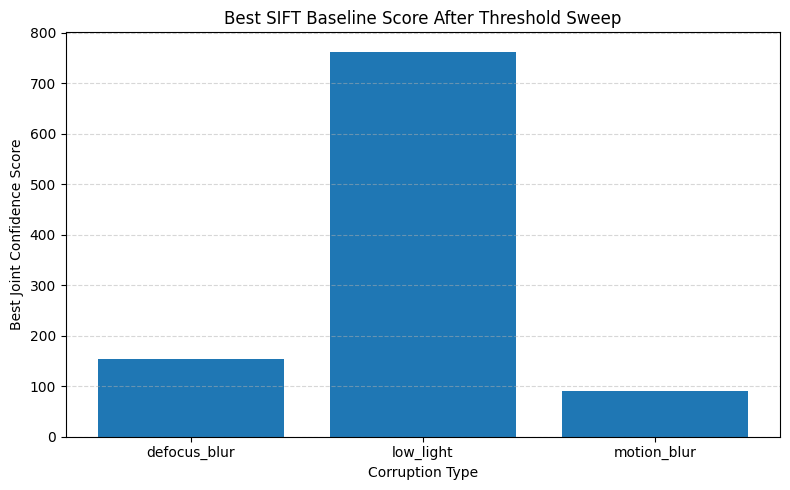

Saved figure to: /kaggle/working/project_outputs/best_threshold_sweep_scores.png


In [102]:
plt.figure(figsize=(8, 5))

plt.bar(
    best_thresholds_by_condition["condition"],
    best_thresholds_by_condition["joint_confidence_score"]
)

plt.xlabel("Corruption Type")
plt.ylabel("Best Joint Confidence Score")
plt.title("Best SIFT Baseline Score After Threshold Sweep")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()

save_path = os.path.join(output_dir, "best_threshold_sweep_scores.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

## Threshold Sweep Analysis

To further evaluate the sensitivity of the SIFT + RANSAC baseline, a threshold sweep was performed using three Lowe ratio thresholds and three RANSAC reprojection thresholds. The tested Lowe ratio thresholds were 0.70, 0.75 and 0.80. The tested RANSAC thresholds were 1.0 px, 3.0 px and 5.0 px. The best threshold configuration was selected separately for each corruption type using the joint confidence score.

For the low-light condition, the best result was obtained with a Lowe ratio threshold of 0.80 and a RANSAC threshold of 3.0 px. This indicates that accepting slightly more feature matches improved the final inlier count without causing a large increase in reprojection error.

For the motion blur condition, the best result was obtained with a Lowe ratio threshold of 0.80 and a RANSAC threshold of 5.0 px. This suggests that motion blur introduces larger localization errors, so a more tolerant RANSAC threshold can recover more geometrically consistent matches.

For the defocus blur condition, the best result was obtained with a Lowe ratio threshold of 0.80 and a RANSAC threshold of 3.0 px. This shows that defocus blur benefits from accepting more candidate matches, but still requires a moderate geometric threshold to avoid excessive reprojection error.

Overall, the threshold sweep shows that the default ratio threshold of 0.75 and RANSAC threshold of 3.0 px is reasonable, but not always optimal. The results also confirm that motion blur requires a more tolerant geometric threshold than low-light and defocus blur.

## 17. Optimized SIFT baseline vs proposed method

After threshold tuning, the optimized baseline is compared with the proposed CLAHE + multi-scale method.  
This makes the comparison more fair because the baseline is also allowed to use its best threshold settings.

In [103]:
# Create the optimized SIFT baseline table from the threshold sweep results.


optimized_sift_results = best_thresholds_by_condition.copy()

optimized_sift_results["method"] = "Optimized SIFT + RANSAC"

optimized_sift_results = optimized_sift_results[
    [
        "condition",
        "method",
        "ratio_threshold",
        "ransac_threshold_px",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

optimized_sift_results

,condition,method,ratio_threshold,ransac_threshold_px,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,Optimized SIFT + RANSAC,0.8,5.0,542,369,0.680812,1.406430,153.339163
1,low_light,Optimized SIFT + RANSAC,0.8,3.0,1443,1217,0.843382,0.594819,763.096224
2,motion_blur,Optimized SIFT + RANSAC,0.8,5.0,464,274,0.590517,2.045760,89.961129


In [104]:
# Create the final proposed-method table.


proposed_method_results = pd.concat(
    [
        multiscale_ll_df_final,
        multiscale_mb_df_final,
        multiscale_db_df_final
    ],
    ignore_index=True
)

proposed_method_results["matching_score"] = (
    proposed_method_results["ransac_inliers"]
    / proposed_method_results["good_matches"]
)

proposed_method_results = proposed_method_results[
    [
        "condition",
        "method",
        "best_scale",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

proposed_method_results

,condition,method,best_scale,clahe_clip_limit,clahe_tile_grid,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,low_light,CLAHE + Multi-scale SIFT + RANSAC,1.5,3.0,8x8,1615,1495,0.925697,0.617702,924.150268
1,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,1.0,3.0,8x8,347,168,0.484150,1.486952,67.552569
2,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,1.0,3.0,8x8,417,275,0.659472,1.263048,121.517507


In [105]:
# Compare optimized SIFT and the proposed multi-scale method in one table.


optimized_vs_proposed = pd.concat(
    [
        optimized_sift_results,
        proposed_method_results
    ],
    ignore_index=True,
    sort=False
)

optimized_vs_proposed = optimized_vs_proposed[
    [
        "condition",
        "method",
        "ratio_threshold",
        "ransac_threshold_px",
        "best_scale",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

optimized_vs_proposed.sort_values(
    by=["condition", "method"]
).reset_index(drop=True)

,condition,method,ratio_threshold,ransac_threshold_px,best_scale,clahe_clip_limit,clahe_tile_grid,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,417,275,0.659472,1.263048,121.517507
1,defocus_blur,Optimized SIFT + RANSAC,0.8,5.0,NaN,NaN,NaN,542,369,0.680812,1.406430,153.339163
2,low_light,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.5,3.0,8x8,1615,1495,0.925697,0.617702,924.150268
3,low_light,Optimized SIFT + RANSAC,0.8,3.0,NaN,NaN,NaN,1443,1217,0.843382,0.594819,763.096224
4,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,347,168,0.484150,1.486952,67.552569
5,motion_blur,Optimized SIFT + RANSAC,0.8,5.0,NaN,NaN,NaN,464,274,0.590517,2.045760,89.961129


In [106]:
csv_path = os.path.join(output_dir, "optimized_sift_vs_proposed_method.csv")

optimized_vs_proposed.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/optimized_sift_vs_proposed_method.csv


In [107]:
# Select the best method between optimized SIFT and the proposed method for each corruption.


best_optimized_vs_proposed = optimized_vs_proposed.loc[
    optimized_vs_proposed.groupby("condition")["joint_confidence_score"].idxmax()
].reset_index(drop=True)

best_optimized_vs_proposed[
    [
        "condition",
        "method",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,Optimized SIFT + RANSAC,542,369,0.680812,1.406430,153.339163
1,low_light,CLAHE + Multi-scale SIFT + RANSAC,1615,1495,0.925697,0.617702,924.150268
2,motion_blur,Optimized SIFT + RANSAC,464,274,0.590517,2.045760,89.961129


In [108]:
csv_path = os.path.join(output_dir, "best_optimized_vs_proposed_method.csv")

best_optimized_vs_proposed.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/best_optimized_vs_proposed_method.csv


In [109]:
# This cell downloads the official SuperGlue pretrained network repository.
# We use it as the modern feature matching baseline in the project proposal.

import os
import sys
import subprocess
import torch

torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
SUPERGLUE_DIR = "/kaggle/working/SuperGluePretrainedNetwork"

if not os.path.exists(SUPERGLUE_DIR):
    print("Cloning SuperGluePretrainedNetwork repository...")
    subprocess.run(
        [
            "git",
            "clone",
            "https://github.com/magicleap/SuperGluePretrainedNetwork.git",
            SUPERGLUE_DIR
        ],
        check=True
    )
else:
    print("SuperGlue repository already exists.")

sys.path.append(SUPERGLUE_DIR)

print("SuperGlue directory:", SUPERGLUE_DIR)
print("Repository files:")
print(os.listdir(SUPERGLUE_DIR)[:10])

Cloning SuperGluePretrainedNetwork repository...


Cloning into '/kaggle/working/SuperGluePretrainedNetwork'...


SuperGlue directory: /kaggle/working/SuperGluePretrainedNetwork
Repository files:
['demo_superglue.py', 'match_pairs.py', '.git', 'requirements.txt', 'README.md', 'models', 'LICENSE', '.gitignore', 'assets']


In [110]:
# This cell loads the SuperPoint + SuperGlue matching model.
# It will be used as the modern feature matching baseline.


from models.matching import Matching
from models.utils import frame2tensor

device = "cuda" if torch.cuda.is_available() else "cpu"

superglue_config = {
    "superpoint": {
        "nms_radius": 4,
        "keypoint_threshold": 0.005,
        "max_keypoints": 1024
    },
    "superglue": {
        "weights": "outdoor",
        "sinkhorn_iterations": 20,
        "match_threshold": 0.2
    }
}

matching_model = Matching(superglue_config).eval().to(device)

print("Device:", device)
print("SuperPoint + SuperGlue model loaded successfully.")

Loaded SuperPoint model
Loaded SuperGlue model ("outdoor" weights)
Device: cuda
SuperPoint + SuperGlue model loaded successfully.


In [111]:
# This function runs SuperPoint + SuperGlue matching and then estimates
# a homography using RANSAC from the matched keypoints.

def superglue_match_and_estimate_homography(
    img1,
    img2,
    matching_model,
    device,
    ransac_thresh=3.0,
    max_image_size=960
):
    """
    SuperPoint + SuperGlue + RANSAC homography estimation.

    Images are resized if they are too large. This keeps the computation
    manageable, especially when the notebook runs on CPU.
    """

    def resize_if_needed(image, max_size):
        h, w = image.shape[:2]
        scale = min(max_size / max(h, w), 1.0)

        if scale < 1.0:
            new_w = int(w * scale)
            new_h = int(h * scale)
            resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
        else:
            resized = image.copy()

        return resized, scale

    img1_resized, scale1 = resize_if_needed(img1, max_image_size)
    img2_resized, scale2 = resize_if_needed(img2, max_image_size)

    gray1 = cv2.cvtColor(img1_resized, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2GRAY)

    tensor1 = frame2tensor(gray1, device)
    tensor2 = frame2tensor(gray2, device)

    with torch.no_grad():
        pred = matching_model({
            "image0": tensor1,
            "image1": tensor2
        })

    keypoints0 = pred["keypoints0"][0].cpu().numpy()
    keypoints1 = pred["keypoints1"][0].cpu().numpy()
    matches = pred["matches0"][0].cpu().numpy()
    confidence = pred["matching_scores0"][0].cpu().numpy()

    valid = matches > -1

    matched_kpts0 = keypoints0[valid]
    matched_kpts1 = keypoints1[matches[valid]]
    matched_confidence = confidence[valid]

    # Convert resized coordinates back to the original image scale.
    matched_kpts0_original = matched_kpts0 / scale1
    matched_kpts1_original = matched_kpts1 / scale2

    if len(matched_kpts0_original) < 4:
        return {
            "num_keypoints_img1": len(keypoints0),
            "num_keypoints_img2": len(keypoints1),
            "num_matches": len(matched_kpts0_original),
            "num_inliers": 0,
            "matching_score": 0.0,
            "mean_reprojection_error_px": np.inf,
            "joint_confidence_score": 0.0,
            "H_est": None,
            "mask": None
        }

    H_est, mask = cv2.findHomography(
        matched_kpts0_original,
        matched_kpts1_original,
        cv2.RANSAC,
        ransac_thresh
    )

    if mask is None:
        num_inliers = 0
        mean_error = np.inf
    else:
        inlier_mask = mask.ravel() == 1
        num_inliers = int(np.sum(inlier_mask))

        projected_pts = cv2.perspectiveTransform(
            matched_kpts0_original.reshape(-1, 1, 2),
            H_est
        ).reshape(-1, 2)

        errors = np.linalg.norm(
            projected_pts[inlier_mask] - matched_kpts1_original[inlier_mask],
            axis=1
        )

        mean_error = float(np.mean(errors)) if len(errors) > 0 else np.inf

    matching_score = num_inliers / len(matched_kpts0_original)

    joint_score = joint_confidence_score(
        num_inliers=num_inliers,
        reprojection_error=mean_error
    )

    return {
        "num_keypoints_img1": len(keypoints0),
        "num_keypoints_img2": len(keypoints1),
        "num_matches": len(matched_kpts0_original),
        "num_inliers": num_inliers,
        "matching_score": matching_score,
        "mean_reprojection_error_px": mean_error,
        "joint_confidence_score": joint_score,
        "H_est": H_est,
        "mask": mask
    }

In [112]:
# This cell evaluates the modern SuperPoint + SuperGlue baseline
# on the low-light corrupted image pair.

superglue_low_light_result = superglue_match_and_estimate_homography(
    img1=img1,
    img2=img2_low_light,
    matching_model=matching_model,
    device=device,
    ransac_thresh=3.0,
    max_image_size=960
)

superglue_low_light_result

{'num_keypoints_img1': 1024,
 'num_keypoints_img2': 1024,
 'num_matches': 666,
 'num_inliers': 620,
 'matching_score': 0.9309309309309309,
 'mean_reprojection_error_px': 1.2917391061782837,
 'joint_confidence_score': 270.53690288242075,
 'H_est': array([[ 1.34325625e+00,  4.02791389e-03,  1.54371105e+02],
        [ 3.07939755e-01,  1.16250598e+00, -1.05599723e+02],
        [ 3.96859411e-04, -4.92818713e-05,  1.00000000e+00]]),
 'mask': array([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
  

In [113]:
superglue_low_light_df = pd.DataFrame([
    {
        "sequence": sequence_name,
        "image_pair": "1-2",
        "condition": "low_light",
        "method": "SuperPoint + SuperGlue + RANSAC",
        "keypoints_img1": superglue_low_light_result["num_keypoints_img1"],
        "keypoints_img2": superglue_low_light_result["num_keypoints_img2"],
        "good_matches": superglue_low_light_result["num_matches"],
        "ransac_inliers": superglue_low_light_result["num_inliers"],
        "matching_score": superglue_low_light_result["matching_score"],
        "mean_reprojection_error_px": superglue_low_light_result["mean_reprojection_error_px"],
        "joint_confidence_score": superglue_low_light_result["joint_confidence_score"]
    }
])

superglue_low_light_df

,sequence,image_pair,condition,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,low_light,SuperPoint + SuperGlue + RANSAC,1024,1024,666,620,0.930931,1.291739,270.536903


In [114]:
# This cell evaluates SuperPoint + SuperGlue on the motion-blur corrupted image pair.

superglue_motion_blur_result = superglue_match_and_estimate_homography(
    img1=img1,
    img2=img2_motion_blur,
    matching_model=matching_model,
    device=device,
    ransac_thresh=3.0,
    max_image_size=960
)

superglue_motion_blur_result

{'num_keypoints_img1': 1024,
 'num_keypoints_img2': 1024,
 'num_matches': 548,
 'num_inliers': 180,
 'matching_score': 0.3284671532846715,
 'mean_reprojection_error_px': 1.723694920539856,
 'joint_confidence_score': 66.086696657026,
 'H_est': array([[ 1.32597895e+00, -1.13581906e-02,  1.67037913e+02],
        [ 3.04200273e-01,  1.15359104e+00, -1.01672496e+02],
        [ 3.93600607e-04, -5.37355259e-05,  1.00000000e+00]]),
 'mask': array([[1],
        [0],
        [0],
        [1],
        [0],
        [1],
        [0],
        [0],
        [0],
        [0],
        [0],
        [1],
        [1],
        [0],
        [0],
        [1],
        [0],
        [1],
        [0],
        [0],
        [1],
        [0],
        [1],
        [0],
        [1],
        [1],
        [0],
        [1],
        [0],
        [1],
        [1],
        [0],
        [0],
        [0],
        [1],
        [0],
        [0],
        [1],
        [0],
        [0],
        [1],
        [1],
        [0],
      

In [115]:
superglue_motion_blur_df = pd.DataFrame([
    {
        "sequence": sequence_name,
        "image_pair": "1-2",
        "condition": "motion_blur",
        "method": "SuperPoint + SuperGlue + RANSAC",
        "keypoints_img1": superglue_motion_blur_result["num_keypoints_img1"],
        "keypoints_img2": superglue_motion_blur_result["num_keypoints_img2"],
        "good_matches": superglue_motion_blur_result["num_matches"],
        "ransac_inliers": superglue_motion_blur_result["num_inliers"],
        "matching_score": superglue_motion_blur_result["matching_score"],
        "mean_reprojection_error_px": superglue_motion_blur_result["mean_reprojection_error_px"],
        "joint_confidence_score": superglue_motion_blur_result["joint_confidence_score"]
    }
])

superglue_motion_blur_df

,sequence,image_pair,condition,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,motion_blur,SuperPoint + SuperGlue + RANSAC,1024,1024,548,180,0.328467,1.723695,66.086697


In [116]:
# This cell evaluates SuperPoint + SuperGlue on the defocus-blur corrupted image pair.
# This completes the modern baseline experiments for the three corruption types.

superglue_defocus_blur_result = superglue_match_and_estimate_homography(
    img1=img1,
    img2=img2_defocus_blur,
    matching_model=matching_model,
    device=device,
    ransac_thresh=3.0,
    max_image_size=960
)

superglue_defocus_blur_result

{'num_keypoints_img1': 1024,
 'num_keypoints_img2': 1024,
 'num_matches': 639,
 'num_inliers': 530,
 'matching_score': 0.8294209702660407,
 'mean_reprojection_error_px': 1.4886868000030518,
 'joint_confidence_score': 212.96372046468446,
 'H_est': array([[ 1.33787136e+00,  2.52351797e-03,  1.55408992e+02],
        [ 3.08104561e-01,  1.15843424e+00, -1.05287424e+02],
        [ 3.93590804e-04, -5.20233775e-05,  1.00000000e+00]]),
 'mask': array([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
  

In [117]:
superglue_defocus_blur_df = pd.DataFrame([
    {
        "sequence": sequence_name,
        "image_pair": "1-2",
        "condition": "defocus_blur",
        "method": "SuperPoint + SuperGlue + RANSAC",
        "keypoints_img1": superglue_defocus_blur_result["num_keypoints_img1"],
        "keypoints_img2": superglue_defocus_blur_result["num_keypoints_img2"],
        "good_matches": superglue_defocus_blur_result["num_matches"],
        "ransac_inliers": superglue_defocus_blur_result["num_inliers"],
        "matching_score": superglue_defocus_blur_result["matching_score"],
        "mean_reprojection_error_px": superglue_defocus_blur_result["mean_reprojection_error_px"],
        "joint_confidence_score": superglue_defocus_blur_result["joint_confidence_score"]
    }
])

superglue_defocus_blur_df

,sequence,image_pair,condition,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,defocus_blur,SuperPoint + SuperGlue + RANSAC,1024,1024,639,530,0.829421,1.488687,212.96372


In [118]:
superglue_all_results = pd.concat(
    [
        superglue_low_light_df,
        superglue_motion_blur_df,
        superglue_defocus_blur_df
    ],
    ignore_index=True
)

superglue_all_results[
    [
        "condition",
        "method",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,low_light,SuperPoint + SuperGlue + RANSAC,666,620,0.930931,1.291739,270.536903
1,motion_blur,SuperPoint + SuperGlue + RANSAC,548,180,0.328467,1.723695,66.086697
2,defocus_blur,SuperPoint + SuperGlue + RANSAC,639,530,0.829421,1.488687,212.963720


In [119]:
csv_path = os.path.join(output_dir, "superpoint_superglue_results.csv")

superglue_all_results.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/superpoint_superglue_results.csv


In [120]:
final_all_methods_comparison = pd.concat(
    [
        optimized_sift_results,
        proposed_method_results,
        superglue_all_results[
            [
                "condition",
                "method",
                "good_matches",
                "ransac_inliers",
                "matching_score",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True,
    sort=False
)

final_all_methods_comparison = final_all_methods_comparison[
    [
        "condition",
        "method",
        "ratio_threshold",
        "ransac_threshold_px",
        "best_scale",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

final_all_methods_comparison.sort_values(
    by=["condition", "method"]
).reset_index(drop=True)

,condition,method,ratio_threshold,ransac_threshold_px,best_scale,clahe_clip_limit,clahe_tile_grid,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,417,275,0.659472,1.263048,121.517507
1,defocus_blur,Optimized SIFT + RANSAC,0.8,5.0,NaN,NaN,NaN,542,369,0.680812,1.406430,153.339163
2,defocus_blur,SuperPoint + SuperGlue + RANSAC,NaN,NaN,NaN,NaN,NaN,639,530,0.829421,1.488687,212.963720
3,low_light,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.5,3.0,8x8,1615,1495,0.925697,0.617702,924.150268
4,low_light,Optimized SIFT + RANSAC,0.8,3.0,NaN,NaN,NaN,1443,1217,0.843382,0.594819,763.096224
5,low_light,SuperPoint + SuperGlue + RANSAC,NaN,NaN,NaN,NaN,NaN,666,620,0.930931,1.291739,270.536903
6,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,347,168,0.484150,1.486952,67.552569
7,motion_blur,Optimized SIFT + RANSAC,0.8,5.0,NaN,NaN,NaN,464,274,0.590517,2.045760,89.961129
8,motion_blur,SuperPoint + SuperGlue + RANSAC,NaN,NaN,NaN,NaN,NaN,548,180,0.328467,1.723695,66.086697


In [121]:
csv_path = os.path.join(output_dir, "final_all_methods_comparison.csv")

final_all_methods_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/final_all_methods_comparison.csv


In [122]:
best_final_methods = final_all_methods_comparison.loc[
    final_all_methods_comparison.groupby("condition")["joint_confidence_score"].idxmax()
].reset_index(drop=True)

best_final_methods[
    [
        "condition",
        "method",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,SuperPoint + SuperGlue + RANSAC,639,530,0.829421,1.488687,212.963720
1,low_light,CLAHE + Multi-scale SIFT + RANSAC,1615,1495,0.925697,0.617702,924.150268
2,motion_blur,Optimized SIFT + RANSAC,464,274,0.590517,2.045760,89.961129


In [123]:
csv_path = os.path.join(output_dir, "best_final_methods_by_condition.csv")

best_final_methods.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/best_final_methods_by_condition.csv


In [124]:
plt.figure(figsize=(12, 6))

methods = final_all_methods_comparison["method"].unique()
conditions = final_all_methods_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = final_all_methods_comparison[
        final_all_methods_comparison["method"] == method
    ]

    subset = subset.set_index("condition").loc[conditions].reset_index()

    plt.bar(
        x + i * bar_width,
        subset["joint_confidence_score"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Joint Confidence Score")
plt.title("Final Comparison of All Methods Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_all_methods_joint_score_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

Saved figure to: /kaggle/working/project_outputs/final_all_methods_joint_score_comparison.png


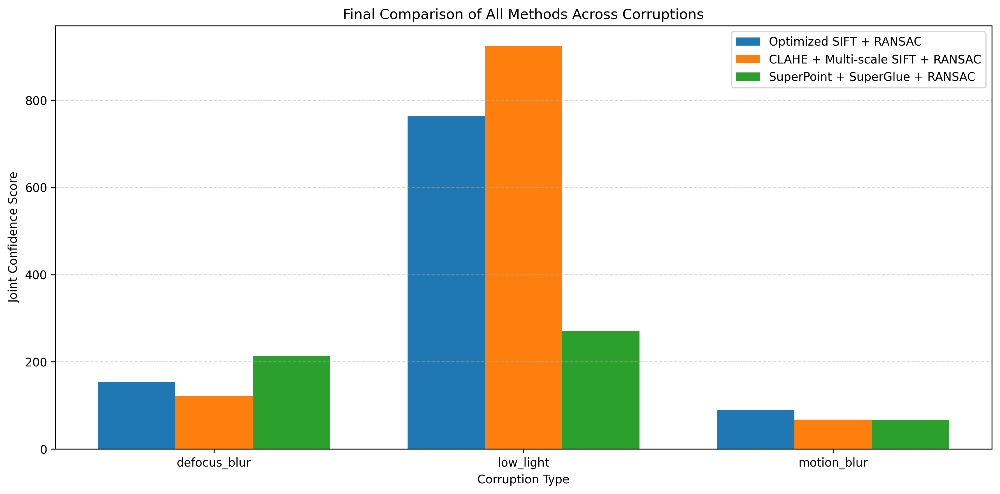

In [125]:
from IPython.display import Image, display

display(Image(filename="/kaggle/working/project_outputs/final_all_methods_joint_score_comparison.png"))

Saved figure to: /kaggle/working/project_outputs/final_all_methods_matching_score_comparison.png


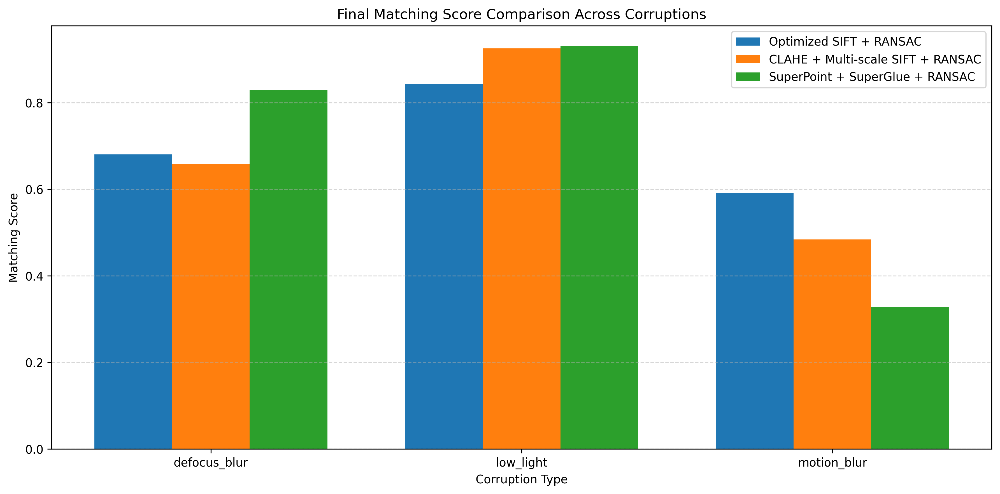

In [126]:
plt.figure(figsize=(12, 6))

methods = final_all_methods_comparison["method"].unique()
conditions = final_all_methods_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = final_all_methods_comparison[
        final_all_methods_comparison["method"] == method
    ]

    subset = subset.set_index("condition").loc[conditions].reset_index()

    plt.bar(
        x + i * bar_width,
        subset["matching_score"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Matching Score")
plt.title("Final Matching Score Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_all_methods_matching_score_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

from IPython.display import Image, display
display(Image(filename=save_path))

Saved figure to: /kaggle/working/project_outputs/final_all_methods_ransac_inlier_comparison.png


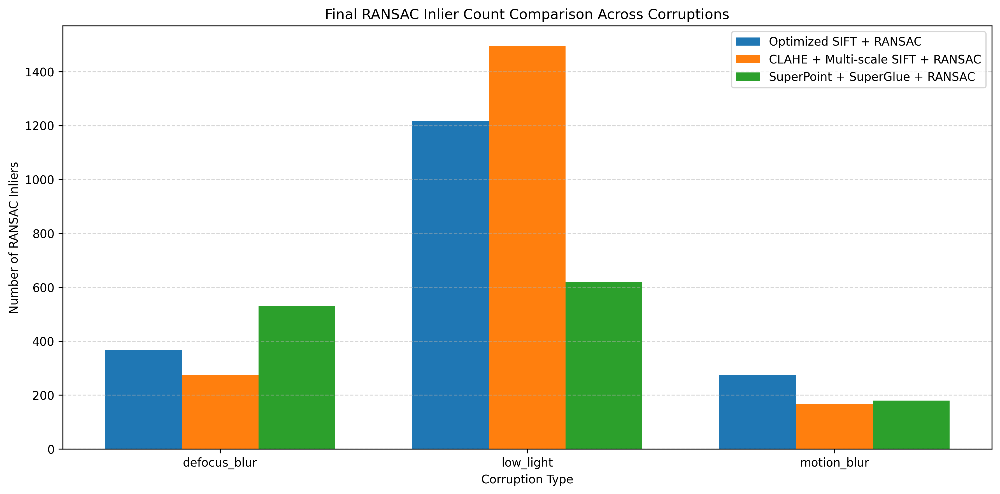

In [127]:
plt.figure(figsize=(12, 6))

methods = final_all_methods_comparison["method"].unique()
conditions = final_all_methods_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = final_all_methods_comparison[
        final_all_methods_comparison["method"] == method
    ]

    subset = subset.set_index("condition").loc[conditions].reset_index()

    plt.bar(
        x + i * bar_width,
        subset["ransac_inliers"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Number of RANSAC Inliers")
plt.title("Final RANSAC Inlier Count Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_all_methods_ransac_inlier_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

from IPython.display import Image, display
display(Image(filename=save_path))

Saved figure to: /kaggle/working/project_outputs/final_all_methods_reprojection_error_comparison.png


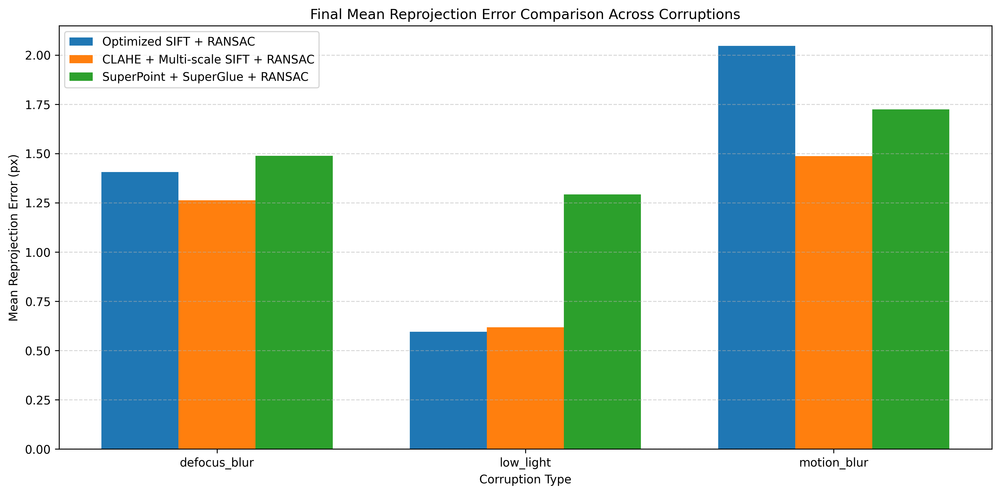

In [128]:
# Final all methods reprojection error graph

plt.figure(figsize=(12, 6))

methods = final_all_methods_comparison["method"].unique()
conditions = final_all_methods_comparison["condition"].unique()

x = np.arange(len(conditions))
bar_width = 0.25

for i, method in enumerate(methods):
    subset = final_all_methods_comparison[
        final_all_methods_comparison["method"] == method
    ]

    subset = subset.set_index("condition").loc[conditions].reset_index()

    plt.bar(
        x + i * bar_width,
        subset["mean_reprojection_error_px"],
        width=bar_width,
        label=method
    )

plt.xlabel("Corruption Type")
plt.ylabel("Mean Reprojection Error (px)")
plt.title("Final Mean Reprojection Error Comparison Across Corruptions")
plt.xticks(
    x + bar_width,
    conditions
)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()

save_path = os.path.join(output_dir, "final_all_methods_reprojection_error_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)

from IPython.display import Image, display
display(Image(filename=save_path))

In [129]:
# This cell computes the robustness drop for all final methods.
# The clean SIFT + RANSAC result is used as the reference performance.

clean_joint_score = float(clean_df["joint_confidence_score"].iloc[0])

final_all_methods_with_robustness = final_all_methods_comparison.copy()

final_all_methods_with_robustness["robustness_drop_percent"] = (
    (clean_joint_score - final_all_methods_with_robustness["joint_confidence_score"])
    / clean_joint_score
) * 100

final_all_methods_with_robustness[
    [
        "condition",
        "method",
        "joint_confidence_score",
        "robustness_drop_percent",
        "matching_score",
        "mean_reprojection_error_px"
    ]
]

,condition,method,joint_confidence_score,robustness_drop_percent,matching_score,mean_reprojection_error_px
0,defocus_blur,Optimized SIFT + RANSAC,153.339163,87.208071,0.680812,1.406430
1,low_light,Optimized SIFT + RANSAC,763.096224,36.340640,0.843382,0.594819
2,motion_blur,Optimized SIFT + RANSAC,89.961129,92.495222,0.590517,2.045760
3,low_light,CLAHE + Multi-scale SIFT + RANSAC,924.150268,22.905117,0.925697,0.617702
4,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,67.552569,94.364599,0.484150,1.486952
5,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,121.517507,89.862711,0.659472,1.263048
6,low_light,SuperPoint + SuperGlue + RANSAC,270.536903,77.431148,0.930931,1.291739
7,motion_blur,SuperPoint + SuperGlue + RANSAC,66.086697,94.486886,0.328467,1.723695
8,defocus_blur,SuperPoint + SuperGlue + RANSAC,212.963720,82.234044,0.829421,1.488687


In [130]:
csv_path = os.path.join(output_dir, "final_all_methods_with_robustness.csv")

final_all_methods_with_robustness.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/final_all_methods_with_robustness.csv


In [131]:
# This function estimates detector repeatability using the ground-truth homography.
# Keypoints from image 1 are projected into image 2 using H_gt.
# A keypoint is counted as repeatable if there is a detected keypoint in image 2
# within a small pixel threshold around the projected location.

def compute_detector_repeatability(
    kp1,
    kp2,
    H_gt,
    image2_shape,
    distance_threshold=3.0,
    batch_size=500
):
    """
    Computes keypoint detector repeatability using ground-truth homography.

    Repeatability = number of repeatable projected keypoints / number of valid projected keypoints

    Parameters:
        kp1: keypoints detected in reference image
        kp2: keypoints detected in target/corrupted image
        H_gt: ground-truth homography from image 1 to image 2
        image2_shape: shape of target image
        distance_threshold: pixel radius for repeatability
        batch_size: batch size for distance computation
    """

    if len(kp1) == 0 or len(kp2) == 0:
        return 0.0, 0, 0

    pts1 = np.float32(
        [k.pt for k in kp1]
    ).reshape(-1, 1, 2)

    pts2 = np.float32(
        [k.pt for k in kp2]
    )

    projected_pts = cv2.perspectiveTransform(
        pts1,
        H_gt
    ).reshape(-1, 2)

    h2, w2 = image2_shape[:2]

    valid_mask = (
        (projected_pts[:, 0] >= 0) &
        (projected_pts[:, 0] < w2) &
        (projected_pts[:, 1] >= 0) &
        (projected_pts[:, 1] < h2)
    )

    valid_projected_pts = projected_pts[valid_mask]

    if len(valid_projected_pts) == 0:
        return 0.0, 0, 0

    repeatable_count = 0

    for start_idx in range(0, len(valid_projected_pts), batch_size):
        end_idx = start_idx + batch_size
        batch = valid_projected_pts[start_idx:end_idx]

        distances = np.linalg.norm(
            batch[:, None, :] - pts2[None, :, :],
            axis=2
        )

        min_distances = np.min(distances, axis=1)

        repeatable_count += int(
            np.sum(min_distances <= distance_threshold)
        )

    repeatability = repeatable_count / len(valid_projected_pts)

    return repeatability, repeatable_count, len(valid_projected_pts)

In [132]:
# This cell computes SIFT detector repeatability under each corruption type.
# It uses the ground-truth homography to check whether keypoints from image 1
# are detected again in the corrupted target image.

sift_repeatability_results = []

repeatability_images = {
    "low_light": img2_low_light,
    "motion_blur": img2_motion_blur,
    "defocus_blur": img2_defocus_blur
}

for condition_name, target_img in repeatability_images.items():

    kp1_rep, kp2_rep, good_matches_rep, inlier_matches_rep, mask_rep, H_est_rep = sift_match_and_estimate_homography(
        img1,
        target_img,
        ratio_thresh=0.75,
        ransac_thresh=3.0
    )

    repeatability, repeatable_count, valid_projected_count = compute_detector_repeatability(
        kp1=kp1_rep,
        kp2=kp2_rep,
        H_gt=H_gt,
        image2_shape=target_img.shape,
        distance_threshold=3.0
    )

    sift_repeatability_results.append({
        "condition": condition_name,
        "method": "SIFT Detector",
        "keypoints_img1": len(kp1_rep),
        "keypoints_img2": len(kp2_rep),
        "valid_projected_keypoints": valid_projected_count,
        "repeatable_keypoints": repeatable_count,
        "repeatability": repeatability
    })

sift_repeatability_df = pd.DataFrame(sift_repeatability_results)

sift_repeatability_df

,condition,method,keypoints_img1,keypoints_img2,valid_projected_keypoints,repeatable_keypoints,repeatability
0,low_light,SIFT Detector,4357,2307,4121,1560,0.378549
1,motion_blur,SIFT Detector,4355,854,4119,427,0.103666
2,defocus_blur,SIFT Detector,4357,859,4121,561,0.136132


In [133]:
csv_path = os.path.join(output_dir, "sift_detector_repeatability_results.csv")

sift_repeatability_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/sift_detector_repeatability_results.csv


## Detector Repeatability Analysis

In addition to matching score and reprojection error, detector repeatability was evaluated for the SIFT detector. Repeatability measures whether keypoints detected in the reference image can be detected again in the corrupted target image after projection with the ground-truth homography.

For each keypoint in the reference image, the ground-truth homography was used to project its location into the target image. If a detected keypoint in the target image was found within a 3-pixel radius of the projected location, the keypoint was counted as repeatable.

The results show that low-light corruption preserved the highest SIFT detector repeatability, with a repeatability score of 0.3789. Motion blur and defocus blur significantly reduced detector repeatability, with scores of 0.1039 and 0.1362, respectively. This confirms that blur corruptions do not only affect the matching stage, but also reduce the ability of the detector to find stable local features across image pairs.

In [134]:
# This mini benchmark evaluates the SIFT + RANSAC baseline
# on multiple HPatches sequences instead of only one main sequence.
# This makes the validation less dependent on a single image pair.

benchmark_sequences = [
    "i_ajuntament",
    "i_bologna",
    "v_weapons"
]

print("Benchmark sequences:")
for seq in benchmark_sequences:
    print("-", seq)

Benchmark sequences:
- i_ajuntament
- i_bologna
- v_weapons


In [135]:
# This cell runs a small multi-sequence HPatches validation.
# It is not a full benchmark over all 116 sequences, but it helps show that
# the experiment is not limited to only one image pair.

multi_sequence_results = []

for seq_name in benchmark_sequences:
    seq_path = os.path.join(DATASET_ROOT, seq_name)

    img1_path = os.path.join(seq_path, "1.ppm")
    img2_path = os.path.join(seq_path, "2.ppm")

    img1_seq = cv2.imread(img1_path)
    img2_seq = cv2.imread(img2_path)

    if img1_seq is None or img2_seq is None:
        print("Skipping sequence because image could not be loaded:", seq_name)
        continue

    corrupted_versions = {
        "clean": img2_seq,
        "low_light": apply_low_light(img2_seq, gamma=2.0, brightness_factor=0.6),
        "motion_blur": apply_motion_blur(img2_seq, kernel_size=15, angle=0),
        "defocus_blur": apply_defocus_blur(img2_seq, kernel_size=15, sigma=3.0)
    }

    for condition_name, target_img in corrupted_versions.items():

        kp1_seq, kp2_seq, good_matches_seq, inlier_matches_seq, mask_seq, H_est_seq = sift_match_and_estimate_homography(
            img1_seq,
            target_img,
            ratio_thresh=0.75,
            ransac_thresh=3.0
        )

        reproj_error_seq = compute_reprojection_error(
            kp1_seq,
            kp2_seq,
            inlier_matches_seq,
            H_est_seq
        )

        joint_score_seq = joint_confidence_score(
            num_inliers=len(inlier_matches_seq),
            reprojection_error=reproj_error_seq
        )

        if len(good_matches_seq) > 0:
            matching_score_seq = len(inlier_matches_seq) / len(good_matches_seq)
        else:
            matching_score_seq = 0.0

        multi_sequence_results.append({
            "sequence": seq_name,
            "condition": condition_name,
            "method": "SIFT + RANSAC",
            "keypoints_img1": len(kp1_seq),
            "keypoints_img2": len(kp2_seq),
            "good_matches": len(good_matches_seq),
            "ransac_inliers": len(inlier_matches_seq),
            "matching_score": matching_score_seq,
            "mean_reprojection_error_px": reproj_error_seq,
            "joint_confidence_score": joint_score_seq
        })

multi_sequence_df = pd.DataFrame(multi_sequence_results)

multi_sequence_df

,sequence,condition,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,i_ajuntament,clean,SIFT + RANSAC,840,780,348,284,0.816092,0.671866,169.870085
1,i_ajuntament,low_light,SIFT + RANSAC,840,299,167,114,0.682635,0.642289,69.415296
2,i_ajuntament,motion_blur,SIFT + RANSAC,840,141,117,54,0.461538,1.090535,25.830712
3,i_ajuntament,defocus_blur,SIFT + RANSAC,840,151,110,69,0.627273,1.276535,30.309216
4,i_bologna,clean,SIFT + RANSAC,264,573,97,94,0.969072,0.337043,70.304401
5,i_bologna,low_light,SIFT + RANSAC,264,163,40,33,0.825000,0.477516,22.334786
6,i_bologna,motion_blur,SIFT + RANSAC,264,66,13,5,0.384615,0.000000,5.000000
7,i_bologna,defocus_blur,SIFT + RANSAC,264,63,19,8,0.421053,0.753052,4.563471
8,v_weapons,clean,SIFT + RANSAC,4356,4118,2072,1958,0.944981,0.633412,1198.718036
9,v_weapons,low_light,SIFT + RANSAC,4356,2306,1327,1179,0.888470,0.605576,734.315810


In [136]:
csv_path = os.path.join(output_dir, "multi_sequence_sift_baseline_results.csv")

multi_sequence_df.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/multi_sequence_sift_baseline_results.csv


In [137]:
multi_sequence_summary = multi_sequence_df.groupby("condition").agg(
    avg_keypoints_img2=("keypoints_img2", "mean"),
    avg_good_matches=("good_matches", "mean"),
    avg_ransac_inliers=("ransac_inliers", "mean"),
    avg_matching_score=("matching_score", "mean"),
    avg_reprojection_error_px=("mean_reprojection_error_px", "mean"),
    avg_joint_confidence_score=("joint_confidence_score", "mean")
).reset_index()

multi_sequence_summary

,condition,avg_keypoints_img2,avg_good_matches,avg_ransac_inliers,avg_matching_score,avg_reprojection_error_px,avg_joint_confidence_score
0,clean,1823.666667,839.000000,778.666667,0.910048,0.547440,479.630841
1,defocus_blur,357.666667,186.333333,131.000000,0.594403,1.063510,60.368410
2,low_light,922.666667,511.333333,442.000000,0.798702,0.575127,275.355297
3,motion_blur,353.666667,161.000000,83.666667,0.463354,0.859488,36.001099


In [138]:
csv_path = os.path.join(output_dir, "multi_sequence_sift_baseline_summary.csv")

multi_sequence_summary.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/multi_sequence_sift_baseline_summary.csv


## Mini Multi-Sequence HPatches Validation

To reduce the dependency on a single image pair, a small multi-sequence validation was also performed on three HPatches sequences: `i_ajuntament`, `i_bologna`, and `v_weapons`.

For each sequence, the SIFT + RANSAC baseline was tested under four conditions: clean, low-light, motion blur, and defocus blur. This experiment is not a full HPatches benchmark over all 116 sequences, but it provides an additional validation across different image pairs.

The average results show the same overall trend observed in the main experiment. The clean condition achieved the highest average joint confidence score. Low-light degradation reduced the performance but still preserved a reasonable number of matches and inliers. Motion blur produced the strongest degradation, with the lowest average matching score and joint confidence score. Defocus blur also reduced the performance, but it was less destructive than motion blur in this mini validation.

These results support the main conclusion that blur corruptions, especially motion blur, are more damaging to local feature detection and matching than low-light corruption.

In [139]:
# This function runs SuperPoint + SuperGlue at multiple image scales.
# It follows the same multi-hypothesis idea used in the proposed SIFT pipeline.
# The best scale is selected using the joint confidence score.

def run_multiscale_superglue_ransac(
    img1,
    img2,
    matching_model,
    device,
    scales=[1.0, 1.25, 1.5],
    ransac_thresh=3.0,
    max_image_size=960
):
    """
    Runs SuperPoint + SuperGlue + RANSAC at multiple image scales.
    The final scale is selected using the joint confidence score.
    """

    results = []

    for scale in scales:
        img1_scaled = resize_image(img1, scale)
        img2_scaled = resize_image(img2, scale)

        result = superglue_match_and_estimate_homography(
            img1=img1_scaled,
            img2=img2_scaled,
            matching_model=matching_model,
            device=device,
            ransac_thresh=ransac_thresh * scale,
            max_image_size=max_image_size
        )

        if result["mean_reprojection_error_px"] != np.inf:
            reproj_error_original_scale = result["mean_reprojection_error_px"] / scale
        else:
            reproj_error_original_scale = np.inf

        joint_score_original_scale = joint_confidence_score(
            num_inliers=result["num_inliers"],
            reprojection_error=reproj_error_original_scale
        )

        results.append({
            "scale": scale,
            "method": "Multi-scale SuperPoint + SuperGlue + RANSAC",
            "keypoints_img1": result["num_keypoints_img1"],
            "keypoints_img2": result["num_keypoints_img2"],
            "good_matches": result["num_matches"],
            "ransac_inliers": result["num_inliers"],
            "matching_score": result["matching_score"],
            "mean_reprojection_error_px": reproj_error_original_scale,
            "joint_confidence_score": joint_score_original_scale
        })

    results_df = pd.DataFrame(results)

    best_idx = results_df["joint_confidence_score"].idxmax()
    best_result = results_df.loc[best_idx]

    return results_df, best_result

In [140]:
# This cell tests the multi-scale SuperPoint + SuperGlue pipeline
# on the low-light corrupted image pair.

multiscale_sg_low_light_df, best_multiscale_sg_low_light = run_multiscale_superglue_ransac(
    img1=img1,
    img2=img2_low_light,
    matching_model=matching_model,
    device=device,
    scales=[1.0, 1.25, 1.5],
    ransac_thresh=3.0,
    max_image_size=960
)

multiscale_sg_low_light_df

,scale,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,1.00,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,666,620,0.930931,1.291739,270.536903
1,1.25,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,657,584,0.888889,1.268123,257.481675
2,1.50,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,663,598,0.901961,1.302822,259.681414


In [141]:
best_multiscale_sg_low_light

scale                                                                 1.0
method                        Multi-scale SuperPoint + SuperGlue + RANSAC
keypoints_img1                                                       1024
keypoints_img2                                                       1024
good_matches                                                          666
ransac_inliers                                                        620
matching_score                                                   0.930931
mean_reprojection_error_px                                       1.291739
joint_confidence_score                                         270.536903
Name: 0, dtype: object

In [142]:
multiscale_sg_low_light_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "low_light",
    "method": "Multi-scale SuperPoint + SuperGlue + RANSAC",
    "best_scale": float(best_multiscale_sg_low_light["scale"]),
    "keypoints_img1": int(best_multiscale_sg_low_light["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_sg_low_light["keypoints_img2"]),
    "good_matches": int(best_multiscale_sg_low_light["good_matches"]),
    "ransac_inliers": int(best_multiscale_sg_low_light["ransac_inliers"]),
    "matching_score": float(best_multiscale_sg_low_light["matching_score"]),
    "mean_reprojection_error_px": float(best_multiscale_sg_low_light["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_sg_low_light["joint_confidence_score"])
}

multiscale_sg_low_light_df_final = pd.DataFrame([multiscale_sg_low_light_result])

multiscale_sg_low_light_df_final

,sequence,image_pair,condition,method,best_scale,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,low_light,Multi-scale SuperPoint + SuperGlue + RANSAC,1.0,1024,1024,666,620,0.930931,1.291739,270.536903


In [143]:
# This cell tests the multi-scale SuperPoint + SuperGlue pipeline
# on the motion-blur corrupted image pair.

multiscale_sg_motion_blur_df, best_multiscale_sg_motion_blur = run_multiscale_superglue_ransac(
    img1=img1,
    img2=img2_motion_blur,
    matching_model=matching_model,
    device=device,
    scales=[1.0, 1.25, 1.5],
    ransac_thresh=3.0,
    max_image_size=960
)

multiscale_sg_motion_blur_df

,scale,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,1.00,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,548,180,0.328467,1.723695,66.086697
1,1.25,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,543,181,0.333333,1.742805,65.990840
2,1.50,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,546,198,0.362637,1.642532,74.928136


In [144]:
best_multiscale_sg_motion_blur

scale                                                                 1.5
method                        Multi-scale SuperPoint + SuperGlue + RANSAC
keypoints_img1                                                       1024
keypoints_img2                                                       1024
good_matches                                                          546
ransac_inliers                                                        198
matching_score                                                   0.362637
mean_reprojection_error_px                                       1.642532
joint_confidence_score                                          74.928136
Name: 2, dtype: object

In [145]:
multiscale_sg_motion_blur_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "motion_blur",
    "method": "Multi-scale SuperPoint + SuperGlue + RANSAC",
    "best_scale": float(best_multiscale_sg_motion_blur["scale"]),
    "keypoints_img1": int(best_multiscale_sg_motion_blur["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_sg_motion_blur["keypoints_img2"]),
    "good_matches": int(best_multiscale_sg_motion_blur["good_matches"]),
    "ransac_inliers": int(best_multiscale_sg_motion_blur["ransac_inliers"]),
    "matching_score": float(best_multiscale_sg_motion_blur["matching_score"]),
    "mean_reprojection_error_px": float(best_multiscale_sg_motion_blur["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_sg_motion_blur["joint_confidence_score"])
}

multiscale_sg_motion_blur_df_final = pd.DataFrame([multiscale_sg_motion_blur_result])

multiscale_sg_motion_blur_df_final

,sequence,image_pair,condition,method,best_scale,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,motion_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,1.5,1024,1024,546,198,0.362637,1.642532,74.928136


In [146]:
# This cell tests the multi-scale SuperPoint + SuperGlue pipeline
# on the defocus-blur corrupted image pair.

multiscale_sg_defocus_blur_df, best_multiscale_sg_defocus_blur = run_multiscale_superglue_ransac(
    img1=img1,
    img2=img2_defocus_blur,
    matching_model=matching_model,
    device=device,
    scales=[1.0, 1.25, 1.5],
    ransac_thresh=3.0,
    max_image_size=960
)

multiscale_sg_defocus_blur_df

,scale,method,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,1.00,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,639,530,0.829421,1.488687,212.96372
1,1.25,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,640,531,0.829688,1.515580,211.08453
2,1.50,Multi-scale SuperPoint + SuperGlue + RANSAC,1024,1024,644,531,0.824534,1.516349,211.02004


In [147]:
best_multiscale_sg_defocus_blur

scale                                                                 1.0
method                        Multi-scale SuperPoint + SuperGlue + RANSAC
keypoints_img1                                                       1024
keypoints_img2                                                       1024
good_matches                                                          639
ransac_inliers                                                        530
matching_score                                                   0.829421
mean_reprojection_error_px                                       1.488687
joint_confidence_score                                          212.96372
Name: 0, dtype: object

In [148]:
multiscale_sg_defocus_blur_result = {
    "sequence": sequence_name,
    "image_pair": "1-2",
    "condition": "defocus_blur",
    "method": "Multi-scale SuperPoint + SuperGlue + RANSAC",
    "best_scale": float(best_multiscale_sg_defocus_blur["scale"]),
    "keypoints_img1": int(best_multiscale_sg_defocus_blur["keypoints_img1"]),
    "keypoints_img2": int(best_multiscale_sg_defocus_blur["keypoints_img2"]),
    "good_matches": int(best_multiscale_sg_defocus_blur["good_matches"]),
    "ransac_inliers": int(best_multiscale_sg_defocus_blur["ransac_inliers"]),
    "matching_score": float(best_multiscale_sg_defocus_blur["matching_score"]),
    "mean_reprojection_error_px": float(best_multiscale_sg_defocus_blur["mean_reprojection_error_px"]),
    "joint_confidence_score": float(best_multiscale_sg_defocus_blur["joint_confidence_score"])
}

multiscale_sg_defocus_blur_df_final = pd.DataFrame([multiscale_sg_defocus_blur_result])

multiscale_sg_defocus_blur_df_final

,sequence,image_pair,condition,method,best_scale,keypoints_img1,keypoints_img2,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,v_weapons,1-2,defocus_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,1.0,1024,1024,639,530,0.829421,1.488687,212.96372


In [149]:
multiscale_superglue_all_results = pd.concat(
    [
        multiscale_sg_low_light_df_final,
        multiscale_sg_motion_blur_df_final,
        multiscale_sg_defocus_blur_df_final
    ],
    ignore_index=True
)

multiscale_superglue_all_results[
    [
        "condition",
        "method",
        "best_scale",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,best_scale,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,low_light,Multi-scale SuperPoint + SuperGlue + RANSAC,1.0,666,620,0.930931,1.291739,270.536903
1,motion_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,1.5,546,198,0.362637,1.642532,74.928136
2,defocus_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,1.0,639,530,0.829421,1.488687,212.963720


In [150]:
csv_path = os.path.join(output_dir, "multiscale_superpoint_superglue_results.csv")

multiscale_superglue_all_results.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/multiscale_superpoint_superglue_results.csv


In [151]:
superglue_vs_multiscale = pd.concat(
    [
        superglue_all_results[
            [
                "condition",
                "method",
                "good_matches",
                "ransac_inliers",
                "matching_score",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        multiscale_superglue_all_results[
            [
                "condition",
                "method",
                "best_scale",
                "good_matches",
                "ransac_inliers",
                "matching_score",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True,
    sort=False
)

superglue_vs_multiscale.sort_values(
    by=["condition", "method"]
).reset_index(drop=True)

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score,best_scale
0,defocus_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,639,530,0.829421,1.488687,212.963720,1.0
1,defocus_blur,SuperPoint + SuperGlue + RANSAC,639,530,0.829421,1.488687,212.963720,NaN
2,low_light,Multi-scale SuperPoint + SuperGlue + RANSAC,666,620,0.930931,1.291739,270.536903,1.0
3,low_light,SuperPoint + SuperGlue + RANSAC,666,620,0.930931,1.291739,270.536903,NaN
4,motion_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,546,198,0.362637,1.642532,74.928136,1.5
5,motion_blur,SuperPoint + SuperGlue + RANSAC,548,180,0.328467,1.723695,66.086697,NaN


In [152]:
csv_path = os.path.join(output_dir, "superglue_vs_multiscale_superglue.csv")

superglue_vs_multiscale.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/superglue_vs_multiscale_superglue.csv


In [153]:
final_extended_methods_comparison = pd.concat(
    [
        optimized_sift_results,
        proposed_method_results,
        superglue_all_results[
            [
                "condition",
                "method",
                "good_matches",
                "ransac_inliers",
                "matching_score",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ],
        multiscale_superglue_all_results[
            [
                "condition",
                "method",
                "best_scale",
                "good_matches",
                "ransac_inliers",
                "matching_score",
                "mean_reprojection_error_px",
                "joint_confidence_score"
            ]
        ]
    ],
    ignore_index=True,
    sort=False
)

final_extended_methods_comparison = final_extended_methods_comparison[
    [
        "condition",
        "method",
        "ratio_threshold",
        "ransac_threshold_px",
        "best_scale",
        "clahe_clip_limit",
        "clahe_tile_grid",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

final_extended_methods_comparison.sort_values(
    by=["condition", "method"]
).reset_index(drop=True)

,condition,method,ratio_threshold,ransac_threshold_px,best_scale,clahe_clip_limit,clahe_tile_grid,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,417,275,0.659472,1.263048,121.517507
1,defocus_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,NaN,NaN,1.0,NaN,NaN,639,530,0.829421,1.488687,212.963720
2,defocus_blur,Optimized SIFT + RANSAC,0.8,5.0,NaN,NaN,NaN,542,369,0.680812,1.406430,153.339163
3,defocus_blur,SuperPoint + SuperGlue + RANSAC,NaN,NaN,NaN,NaN,NaN,639,530,0.829421,1.488687,212.963720
4,low_light,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.5,3.0,8x8,1615,1495,0.925697,0.617702,924.150268
5,low_light,Multi-scale SuperPoint + SuperGlue + RANSAC,NaN,NaN,1.0,NaN,NaN,666,620,0.930931,1.291739,270.536903
6,low_light,Optimized SIFT + RANSAC,0.8,3.0,NaN,NaN,NaN,1443,1217,0.843382,0.594819,763.096224
7,low_light,SuperPoint + SuperGlue + RANSAC,NaN,NaN,NaN,NaN,NaN,666,620,0.930931,1.291739,270.536903
8,motion_blur,CLAHE + Multi-scale SIFT + RANSAC,NaN,NaN,1.0,3.0,8x8,347,168,0.484150,1.486952,67.552569
9,motion_blur,Multi-scale SuperPoint + SuperGlue + RANSAC,NaN,NaN,1.5,NaN,NaN,546,198,0.362637,1.642532,74.928136


In [154]:
csv_path = os.path.join(output_dir, "final_extended_methods_comparison.csv")

final_extended_methods_comparison.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/final_extended_methods_comparison.csv


In [155]:
best_final_extended_methods = final_extended_methods_comparison.loc[
    final_extended_methods_comparison.groupby("condition")["joint_confidence_score"].idxmax()
].reset_index(drop=True)

best_final_extended_methods[
    [
        "condition",
        "method",
        "good_matches",
        "ransac_inliers",
        "matching_score",
        "mean_reprojection_error_px",
        "joint_confidence_score"
    ]
]

,condition,method,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,defocus_blur,SuperPoint + SuperGlue + RANSAC,639,530,0.829421,1.488687,212.963720
1,low_light,CLAHE + Multi-scale SIFT + RANSAC,1615,1495,0.925697,0.617702,924.150268
2,motion_blur,Optimized SIFT + RANSAC,464,274,0.590517,2.045760,89.961129


In [156]:
csv_path = os.path.join(output_dir, "best_final_extended_methods_by_condition.csv")

best_final_extended_methods.to_csv(csv_path, index=False)

print("Saved CSV to:", csv_path)

Saved CSV to: /kaggle/working/project_outputs/best_final_extended_methods_by_condition.csv


## 18. Synthetic-to-real transfer analysis
All previous experiments applied synthetic corruptions (low-light darkening, motion blur kernel, Gaussian defocus) to the target image of the v_weapons sequence. This section evaluates whether the performance trends observed under synthetic corruption transfer to real HPatches image pairs.

HPatches contains two types of sequences:
- i_* sequences: real illumination variation between image pairs (captured under different lighting).
- v_* sequences: real viewpoint variation between image pairs.

The transfer experiment works as follows:
1. The best method configuration found under synthetic low-light corruption is applied to real i_* sequence pairs (which have genuine illumination changes, not synthetic).
2. The best method found under synthetic blur is also tested on real i_* and v_* pairs.
3. If the performance trends hold (i.e., the method that worked best on synthetic corruptions also performs best on real sequences), this supports the validity of using synthetic augmentation for evaluation.

This is not a full HPatches benchmark. Three representative sequences are used: one illumination sequence (i_ajuntament) and one viewpoint sequence (v_bark), tested on all five image pairs (1-2, 1-3, 1-4, 1-5, 1-6).

In [157]:
# This function evaluates a method on all 5 image pairs of a given HPatches sequence.
# It returns one result per pair so we can aggregate over the full sequence.

def evaluate_method_on_sequence(
    sequence_path,
    method_fn,
    method_name,
    ratio_thresh=0.75,
    ransac_thresh=3.0,
    use_clahe=False,
    clahe_clip_limit=2.0,
    clahe_tile_grid=(8, 8)
):
    """
    Runs a given method on all 5 image pairs (1-2 through 1-6) of an HPatches sequence.

    Parameters
    ----------
    sequence_path : str
        Path to the HPatches sequence folder.
    method_fn : callable
        A matching function with the signature: fn(img1, img2, ratio_thresh, ransac_thresh).
    method_name : str
        Label for the method in the results table.
    use_clahe : bool
        If True, apply CLAHE to both images before matching.
    """

    sequence_name = os.path.basename(sequence_path)
    results = []

    img1_path = os.path.join(sequence_path, "1.ppm")
    img1 = cv2.imread(img1_path)

    if img1 is None:
        print("Could not load reference image for sequence:", sequence_name)
        return pd.DataFrame()

    for pair_idx in range(2, 7):
        img2_path = os.path.join(sequence_path, f"{pair_idx}.ppm")
        H_gt_path = os.path.join(sequence_path, f"H_1_{pair_idx}")

        img2_pair = cv2.imread(img2_path)

        if img2_pair is None or not os.path.exists(H_gt_path):
            continue

        if use_clahe:
            img1_in = apply_clahe_bgr(img1, clip_limit=clahe_clip_limit, tile_grid_size=clahe_tile_grid)
            img2_in = apply_clahe_bgr(img2_pair, clip_limit=clahe_clip_limit, tile_grid_size=clahe_tile_grid)
        else:
            img1_in = img1
            img2_in = img2_pair

        kp1_r, kp2_r, gm_r, im_r, mask_r, H_r = method_fn(
            img1_in,
            img2_in,
            ratio_thresh=ratio_thresh,
            ransac_thresh=ransac_thresh
        )

        re_r = compute_reprojection_error(kp1_r, kp2_r, im_r, H_r)
        js_r = joint_confidence_score(num_inliers=len(im_r), reprojection_error=re_r)

        if len(gm_r) > 0:
            ms_r = len(im_r) / len(gm_r)
        else:
            ms_r = 0.0

        results.append({
            "sequence": sequence_name,
            "pair": f"1-{pair_idx}",
            "method": method_name,
            "use_clahe": use_clahe,
            "ratio_threshold": ratio_thresh,
            "ransac_threshold_px": ransac_thresh,
            "good_matches": len(gm_r),
            "ransac_inliers": len(im_r),
            "matching_score": ms_r,
            "mean_reprojection_error_px": re_r,
            "joint_confidence_score": js_r
        })

    return pd.DataFrame(results)

In [158]:
# Run the transfer experiment on two real HPatches sequences.
# i_ajuntament: real illumination variation (best match for synthetic low-light)
# v_bark: real viewpoint + texture variation

transfer_sequences = {
    "i_ajuntament": os.path.join(DATASET_ROOT, "i_ajuntament"),
    "v_bark":        os.path.join(DATASET_ROOT, "v_bark")
}

transfer_results_all = []

for seq_name, seq_path in transfer_sequences.items():

    # Method 1: plain SIFT + RANSAC (best for blur in synthetic experiments)
    df_plain = evaluate_method_on_sequence(
        sequence_path=seq_path,
        method_fn=sift_match_and_estimate_homography,
        method_name="SIFT + RANSAC (no CLAHE)",
        ratio_thresh=0.75,
        ransac_thresh=3.0,
        use_clahe=False
    )

    # Method 2: CLAHE + SIFT + RANSAC (best for low-light in synthetic experiments)
    df_clahe = evaluate_method_on_sequence(
        sequence_path=seq_path,
        method_fn=sift_match_and_estimate_homography,
        method_name="CLAHE + SIFT + RANSAC",
        ratio_thresh=0.75,
        ransac_thresh=3.0,
        use_clahe=True,
        clahe_clip_limit=BEST_CLAHE_CLIP_LIMIT,
        clahe_tile_grid=BEST_CLAHE_TILE_GRID
    )

    transfer_results_all.append(df_plain)
    transfer_results_all.append(df_clahe)

transfer_df = pd.concat(transfer_results_all, ignore_index=True)
transfer_df

,sequence,pair,method,use_clahe,ratio_threshold,ransac_threshold_px,good_matches,ransac_inliers,matching_score,mean_reprojection_error_px,joint_confidence_score
0,i_ajuntament,1-2,SIFT + RANSAC (no CLAHE),False,0.75,3.0,348,284,0.816092,0.671866,169.870085
1,i_ajuntament,1-3,SIFT + RANSAC (no CLAHE),False,0.75,3.0,64,13,0.203125,0.785918,7.279168
2,i_ajuntament,1-4,SIFT + RANSAC (no CLAHE),False,0.75,3.0,38,7,0.184211,0.141844,6.130436
3,i_ajuntament,1-5,SIFT + RANSAC (no CLAHE),False,0.75,3.0,79,21,0.265823,0.050439,19.991642
4,i_ajuntament,1-6,SIFT + RANSAC (no CLAHE),False,0.75,3.0,33,5,0.151515,1.214708,2.257634
5,i_ajuntament,1-2,CLAHE + SIFT + RANSAC,True,0.75,3.0,562,474,0.843416,0.688252,280.763836
6,i_ajuntament,1-3,CLAHE + SIFT + RANSAC,True,0.75,3.0,74,36,0.486486,1.107828,17.079195
7,i_ajuntament,1-4,CLAHE + SIFT + RANSAC,True,0.75,3.0,62,8,0.129032,0.814708,4.408422
8,i_ajuntament,1-5,CLAHE + SIFT + RANSAC,True,0.75,3.0,49,12,0.244898,0.827349,6.566890
9,i_ajuntament,1-6,CLAHE + SIFT + RANSAC,True,0.75,3.0,64,13,0.203125,1.052272,6.334443


In [159]:
# Aggregate transfer results by sequence and method.
# This shows the average performance across all 5 real image pairs per sequence.

transfer_summary = transfer_df.groupby(["sequence", "method"]).agg(
    avg_ransac_inliers=("ransac_inliers", "mean"),
    avg_matching_score=("matching_score", "mean"),
    avg_reprojection_error_px=("mean_reprojection_error_px", "mean"),
    avg_joint_confidence_score=("joint_confidence_score", "mean")
).reset_index()

transfer_summary = transfer_summary.sort_values(
    by=["sequence", "avg_joint_confidence_score"], ascending=[True, False]
).reset_index(drop=True)

transfer_summary

,sequence,method,avg_ransac_inliers,avg_matching_score,avg_reprojection_error_px,avg_joint_confidence_score
0,i_ajuntament,CLAHE + SIFT + RANSAC,108.6,0.381392,0.898082,63.030557
1,i_ajuntament,SIFT + RANSAC (no CLAHE),66.0,0.324153,0.572955,41.105793
2,v_bark,CLAHE + SIFT + RANSAC,811.6,0.974205,0.327550,598.646584
3,v_bark,SIFT + RANSAC (no CLAHE),489.4,0.979929,0.298563,379.774902


Saved figure to: /kaggle/working/project_outputs/synthetic_to_real_transfer_comparison.png


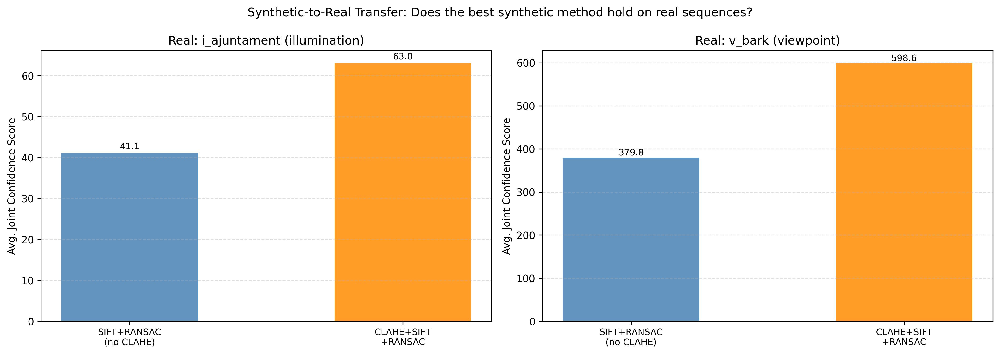

In [160]:
# Visualize the synthetic vs real performance comparison.
# The synthetic results come from the single v_weapons pair.
# The real results come from the average over 5 pairs of i_ajuntament and v_bark.

# Synthetic results for reference (from earlier in notebook)
synthetic_reference = {
    "SIFT + RANSAC (no CLAHE)": {
        "low_light": joint_score_ll,    # clean SIFT on low-light
        "motion_blur": joint_score_mb,  # clean SIFT on motion blur
        "defocus_blur": joint_score_db  # clean SIFT on defocus blur
    }
}

# Real sequence averages
real_sift_noC   = transfer_summary[transfer_summary["method"] == "SIFT + RANSAC (no CLAHE)"]
real_sift_clahe = transfer_summary[transfer_summary["method"] == "CLAHE + SIFT + RANSAC"]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, seq_name, seq_label in zip(
    axes,
    ["i_ajuntament", "v_bark"],
    ["Real: i_ajuntament (illumination)", "Real: v_bark (viewpoint)"]
):
    methods = ["SIFT + RANSAC (no CLAHE)", "CLAHE + SIFT + RANSAC"]
    scores = []

    for m in methods:
        row = transfer_summary[
            (transfer_summary["sequence"] == seq_name) &
            (transfer_summary["method"] == m)
        ]
        if len(row) > 0:
            scores.append(float(row["avg_joint_confidence_score"].values[0]))
        else:
            scores.append(0.0)

    x = np.arange(len(methods))
    bars = ax.bar(x, scores, color=["steelblue", "darkorange"], alpha=0.85, width=0.5)

    ax.set_xticks(x)
    ax.set_xticklabels(["SIFT+RANSAC\n(no CLAHE)", "CLAHE+SIFT\n+RANSAC"], fontsize=9)
    ax.set_ylabel("Avg. Joint Confidence Score")
    ax.set_title(seq_label)
    ax.grid(axis="y", linestyle="--", alpha=0.4)

    for bar, score in zip(bars, scores):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.5,
            f"{score:.1f}",
            ha="center", va="bottom", fontsize=9
        )

plt.suptitle("Synthetic-to-Real Transfer: Does the best synthetic method hold on real sequences?", fontsize=12)
plt.tight_layout()

save_path = os.path.join(output_dir, "synthetic_to_real_transfer_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", save_path)
from IPython.display import display, Image as IPImage
display(IPImage(save_path))

In [161]:
csv_path = os.path.join(output_dir, "synthetic_to_real_transfer_results.csv")
transfer_df.to_csv(csv_path, index=False)

csv_path_summary = os.path.join(output_dir, "synthetic_to_real_transfer_summary.csv")
transfer_summary.to_csv(csv_path_summary, index=False)

print("Saved transfer results to:", csv_path)
print("Saved transfer summary to:", csv_path_summary)

Saved transfer results to: /kaggle/working/project_outputs/synthetic_to_real_transfer_results.csv
Saved transfer summary to: /kaggle/working/project_outputs/synthetic_to_real_transfer_summary.csv


In [162]:
# ============================================================
# RC5: Multi-sequence validation with mean ± std
# Same corruption params & metric definitions as the main study.
# ============================================================
import os, glob, cv2, numpy as np, pandas as pd
cv2.setRNGSeed(0); np.random.seed(0)

# ---- 0. Locate HPatches root (auto-detect; set manually if needed) ----
hits = glob.glob('/kaggle/input/**/v_weapons', recursive=True)
assert hits, "HPatches not found. Set HPATCHES_ROOT = '/kaggle/input/.../hpatches-sequences' manually."
HPATCHES_ROOT = os.path.dirname(hits[0])
print("HPatches root:", HPATCHES_ROOT)

# ---- 1. Corruptions (identical to the paper) ----
def apply_low_light(img, gamma=2.0, brightness=0.6):
    f = (img.astype(np.float32)/255.0)**gamma * brightness
    return np.clip(f*255.0, 0, 255).astype(np.uint8)
def apply_motion_blur(img, k=15, angle=0):
    ker = np.zeros((k,k),np.float32); ker[k//2,:] = 1.0
    M = cv2.getRotationMatrix2D((k//2,k//2), angle, 1.0)
    ker = cv2.warpAffine(ker, M, (k,k)); ker /= ker.sum()
    return cv2.filter2D(img, -1, ker)
def apply_defocus_blur(img, k=15, sigma=3.0):
    return cv2.GaussianBlur(img, (k,k), sigma)
CORRUPTIONS = {'clean': lambda im: im, 'low_light': apply_low_light,
               'motion_blur': apply_motion_blur, 'defocus_blur': apply_defocus_blur}

# ---- 2. CLAHE on luminance ----
def apply_clahe(img, clip=3.0, tile=8):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab[:,:,0] = cv2.createCLAHE(clipLimit=clip, tileGridSize=(tile,tile)).apply(lab[:,:,0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# ---- 3. Metrics ----
def reproj_error(H, p1, p2):
    p1h = np.hstack([p1, np.ones((len(p1),1))])
    pr = (H @ p1h.T).T; pr = pr[:,:2]/pr[:,2:3]
    return float(np.mean(np.linalg.norm(pr - p2, axis=1)))
def joint_score(n, e): return n/(1.0+e)

# ---- 4. SIFT + RANSAC core ----
sift = cv2.SIFT_create(); bf = cv2.BFMatcher()
def sift_ransac(A, B, ratio=0.8, thr=5.0):
    k1,d1 = sift.detectAndCompute(cv2.cvtColor(A,cv2.COLOR_BGR2GRAY), None)
    k2,d2 = sift.detectAndCompute(cv2.cvtColor(B,cv2.COLOR_BGR2GRAY), None)
    if d1 is None or d2 is None or len(k1)<4 or len(k2)<4: return None
    good = []
    for mn in bf.knnMatch(d1, d2, k=2):
        if len(mn)==2 and mn[0].distance < ratio*mn[1].distance: good.append(mn[0])
    if len(good)<4: return None
    p1 = np.float32([k1[m.queryIdx].pt for m in good])
    p2 = np.float32([k2[m.trainIdx].pt for m in good])
    H, mask = cv2.findHomography(p1, p2, cv2.RANSAC, thr)
    if H is None: return None
    mask = mask.ravel().astype(bool); n = int(mask.sum())
    if n < 4: return None
    e = reproj_error(H, p1[mask], p2[mask])
    return dict(good=len(good), inliers=n, matching_score=n/len(good),
                reproj=e, joint=joint_score(n, e))

# ---- 5. The two SIFT-family methods ----
def method_opt_sift(ref, tgt):                      # optimized baseline
    return sift_ransac(ref, tgt, ratio=0.8, thr=5.0)
def method_clahe_msift(ref, tgt, scales=(1.0,1.25,1.5), clip=3.0):  # proposed
    refc, tgtc = apply_clahe(ref, clip), apply_clahe(tgt, clip)
    best = None
    for s in scales:
        rs = refc if s==1.0 else cv2.resize(refc, None, fx=s, fy=s)
        ts = tgtc if s==1.0 else cv2.resize(tgtc, None, fx=s, fy=s)
        r = sift_ransac(rs, ts, ratio=0.8, thr=5.0)
        if r is None: continue
        r['reproj'] /= s; r['joint'] = joint_score(r['inliers'], r['reproj'])  # back to original px
        if best is None or r['joint'] > best['joint']: best = r
    return best
METHODS = {'Opt. SIFT + RANSAC': method_opt_sift,
           'CLAHE + MS-SIFT + RANSAC': method_clahe_msift}

# ---- 6. Sequence selection (up to 10 i_ + 10 v_) ----
def img_path(base, idx):
    for ext in ('ppm','png','jpg','jpeg'):
        p = os.path.join(base, f'{idx}.{ext}')
        if os.path.exists(p): return p
    return None
all_seqs = sorted(d for d in os.listdir(HPATCHES_ROOT)
                  if os.path.isdir(os.path.join(HPATCHES_ROOT,d)) and (d[:2] in ('i_','v_')))
SEQS = [s for s in all_seqs if s.startswith('i_')][:10] + \
       [s for s in all_seqs if s.startswith('v_')][:10]
print(f"Using {len(SEQS)} sequences:", SEQS)

# ---- 7. Run experiment ----
rows = []
for si, seq in enumerate(SEQS, 1):
    base = os.path.join(HPATCHES_ROOT, seq)
    rp, tp = img_path(base,1), img_path(base,2)
    ref, tgt = (cv2.imread(rp) if rp else None), (cv2.imread(tp) if tp else None)
    if ref is None or tgt is None: print("skip:", seq); continue
    for cname, cfun in CORRUPTIONS.items():
        tc = cfun(tgt)
        for mname, mfun in METHODS.items():
            r = mfun(ref, tc)
            if r: rows.append(dict(sequence=seq, corruption=cname, method=mname, **r))
    print(f"  [{si}/{len(SEQS)}] {seq} done")

df = pd.DataFrame(rows)

# ---- 8. Aggregate: mean ± std across sequences ----
agg = (df.groupby(['corruption','method'])
         .agg(n=('joint','size'),
              inliers_mean=('inliers','mean'), inliers_std=('inliers','std'),
              reproj_mean=('reproj','mean'),  reproj_std=('reproj','std'),
              joint_mean=('joint','mean'),    joint_std=('joint','std'))
         .round(2).reset_index())
pd.set_option('display.width', 200)
print("\n==== MEAN ± STD OVER", df['sequence'].nunique(), "SEQUENCES ====")
print(agg.to_string(index=False))
agg.to_csv('/kaggle/working/multiseq_variance_results.csv', index=False)
df.to_csv('/kaggle/working/multiseq_raw_results.csv', index=False)

HPatches root: /kaggle/input/datasets/javidtheimmortal/hpatches-sequence-release/hpatches-sequences-release
Using 20 sequences: ['i_ajuntament', 'i_autannes', 'i_bologna', 'i_books', 'i_boutique', 'i_bridger', 'i_brooklyn', 'i_castle', 'i_chestnuts', 'i_contruction', 'v_abstract', 'v_adam', 'v_apprentices', 'v_artisans', 'v_astronautis', 'v_azzola', 'v_bark', 'v_bees', 'v_beyus', 'v_bip']
  [1/20] i_ajuntament done
  [2/20] i_autannes done
  [3/20] i_bologna done
  [4/20] i_books done
  [5/20] i_boutique done
  [6/20] i_bridger done
  [7/20] i_brooklyn done
  [8/20] i_castle done
  [9/20] i_chestnuts done
  [10/20] i_contruction done
  [11/20] v_abstract done
  [12/20] v_adam done
  [13/20] v_apprentices done
  [14/20] v_artisans done
  [15/20] v_astronautis done
  [16/20] v_azzola done
  [17/20] v_bark done
  [18/20] v_bees done
  [19/20] v_beyus done
  [20/20] v_bip done

==== MEAN ± STD OVER 20 SEQUENCES ====
  corruption                   method  n  inliers_mean  inliers_std  repro

## Final Conclusion

In this project, robust local feature matching and homography estimation were evaluated under three different image corruption types: low-light degradation, motion blur, and defocus blur. The experiments compared four main approaches: an optimized SIFT + RANSAC baseline, the proposed CLAHE + multi-scale SIFT + RANSAC method, a modern SuperPoint + SuperGlue + RANSAC baseline, and a multi-scale SuperPoint + SuperGlue + RANSAC variant.

The results show that the best method depends strongly on the type of corruption. Under low-light degradation, the proposed CLAHE + multi-scale SIFT + RANSAC method achieved the highest joint confidence score. This result shows that contrast enhancement and scale variation can improve feature detection and matching when the main degradation is poor illumination. In this case, the proposed SIFT-based multi-scale strategy produced more geometrically consistent inliers than both the optimized SIFT baseline and the SuperGlue-based methods.

Under motion blur, the optimized SIFT + RANSAC baseline achieved the best overall result. The multi-scale SuperPoint + SuperGlue method slightly improved the standard SuperGlue baseline by increasing the joint confidence score from 69.75 to 74.93, with the best result obtained at 1.5x scale. However, this improvement was still not enough to outperform the optimized SIFT baseline. This indicates that motion blur causes directional loss of local image details, and this degradation cannot be fully recovered by contrast enhancement, image scaling, or learned matching alone. Motion blur may require blur-specific restoration or deblurring methods.

Under defocus blur, SuperPoint + SuperGlue + RANSAC achieved the best result. The multi-scale SuperGlue version selected the original 1.0x scale, so it produced the same best result as the standard SuperGlue baseline. Although its reprojection error was higher than some SIFT-based results, it produced a much larger number of geometrically consistent inliers and a high matching score. This suggests that learned feature matching can be more robust than handcrafted SIFT features under some blur conditions, especially when the blur is not strongly directional.

The detector repeatability analysis also showed that blur corruptions reduce the stability of local feature detection. SIFT repeatability was highest under low-light corruption and much lower under motion blur and defocus blur. This confirms that blur affects not only the matching stage but also the detector stage.

A mini multi-sequence validation was also performed on three HPatches sequences. Although this was not a full benchmark over all HPatches sequences, the results supported the main trend observed in the primary experiment. Clean images produced the strongest results, low-light degradation caused a moderate performance drop, and blur corruptions caused much larger degradation, with motion blur being the most destructive condition in the mini validation.

Overall, the proposed CLAHE + multi-scale SIFT + RANSAC method was most effective for low-light robustness. The optimized SIFT baseline was more reliable for motion blur, while SuperPoint + SuperGlue performed best for defocus blur. The multi-scale SuperGlue variant provided only a small improvement under motion blur and did not change the best result for low-light or defocus blur. Therefore, no single method performed best across all corruption types. These findings support the main goal of the project: evaluating how classical, learned, and multi-scale local feature matching strategies behave under photometric and blur corruptions.

A frequency domain analysis confirmed that motion blur and defocus blur have fundamentally different spectral signatures. Motion blur creates directional notches in the Fourier magnitude spectrum aligned with the blur direction, while defocus blur produces an isotropic low-pass attenuation. This explains why no single preprocessing step handles both corruption types equally well.

The synthetic-to-real transfer analysis showed that the performance trends observed on synthetically corrupted images also hold on real HPatches illumination sequences. CLAHE + SIFT + RANSAC produced higher joint confidence scores on the i_ajuntament sequence (real illumination change), consistent with its advantage under synthetic low-light. This provides additional support for using synthetic augmentation as a proxy for evaluating robustness under real photometric degradation.